# Adapted from

https://github.com/Project-MONAI/tutorials/blob/main/modules/transfer_mmar.ipynb

In [ ]:
# !pip install monai
# !python -c "import monai" || pip install -q "monai-weekly[nibabel, lmdb, tqdm]"

In [1]:
import os, sys, shutil, time, pickle, glob
from pathlib import Path

# numpy to SITK conversion
import torch
import numpy     as np
import SimpleITK as sitk

# hardware stats
import GPUtil as GPU

# plot
from helpers.viz import viz_axis, viz_compare_inputs, viz_compare_outputs
from helpers.viz import *

import matplotlib.pyplot as plt

# MONAI
from monai.networks.nets import UNet
from monai.losses import DiceFocalLoss
from monai.metrics import DiceMetric
from monai.inferers import sliding_window_inference
from monai.data import (
    Dataset,
    CacheDataset,
    LMDBDataset,
    DataLoader,
    decollate_batch,
)

from monai.networks.utils import copy_model_state
from monai.optimizers import generate_param_groups

from monai.transforms import (
    AsDiscrete,
    AddChanneld,
    CenterSpatialCropd,
    EnsureChannelFirstd,
    Compose,
    LoadImaged,
    NormalizeIntensityd,
    PadListDataCollate,
    ScaleIntensityRanged,
    Spacingd,
    SpatialPadd,
    Orientationd,
    CropForegroundd,
    RandCropByPosNegLabeld,
    RandAffined,
    RandRotated,
    EnsureType,
    EnsureTyped,
    ToTensord,
)

%matplotlib inline


# Get labels

In [2]:
root = "/home/gologors/data/"

with open(root + 'pitmri/' + 'all_filenames_pt.pkl', 'rb') as f:
    all_filenames_pt = pickle.load(f)

with open(root + 'pitmri/' + 'loni_filenames.pkl', 'rb') as f: 
    loni_filenames = pickle.load(f)
    
# with open(root + 'pitmri/' + 'all_filenames_nii.pkl', 'rb') as f: 
#     all_filenames = pickle.load(f)
    
with open(root + 'pitmri/' + 'las_nii_im_datadict_pt.pkl', 'rb') as f:
     im_datadict_pt = pickle.load(f)

with open(root + 'pitmri/' + 'loni_bboxs_pt.pkl', 'rb') as f:
    loni_bboxs = pickle.load(f)
    
loni_filenames = all_filenames_pt[:len(loni_filenames)]
pit_filenames  = all_filenames_pt[len(loni_filenames):]

print("LONI: ", loni_filenames[0][0])
print("PIT: ", pit_filenames[0][0])

# Split into training/valid and testing 
# adapted from https://github.com/Project-MONAI/tutorials/blob/main/modules/autoencoder_mednist.ipynb

# Split pit filenames

def split(lst, test_frac, valid_frac):

    num_test  = int(len(lst) * test_frac)
    num_valid = int(len(lst) * valid_frac)
    num_train = len(lst) - num_test - num_valid

    train_datadict = [{"im": nii, "lbl":obj} for nii,obj in lst[0:num_train]]
    valid_datadict = [{"im": nii, "lbl":obj} for nii,obj in lst[num_train:num_train+num_valid]]
    test_datadict = [{"im": nii, "lbl": obj} for nii,obj in lst[-num_test:]]
    
    return train_datadict, valid_datadict, test_datadict


pit_train_datadict, pit_valid_datadict, pit_test_datadict    = split(pit_filenames, test_frac=0, valid_frac=0.1) # 50: 45-5-0
loni_train_datadict, loni_valid_datadict, loni_test_datadict = split(loni_filenames, test_frac=0, valid_frac=0.) # 337 all train

# for loni, add info on start/end
def add_coronal_info(lst):
    new = []
    for i,d in enumerate(lst):
        item    = (d["im"],d["lbl"])
        is_loni = ("loni" in d["im"])
        
        # add coronal slices as seperate items
        if is_loni:
            loni_bbox = loni_bboxs[loni_filenames.index(item)]["bbox"]
            start = loni_bbox[2]
            end   = loni_bbox[3]
        else:
            shape = im_datadict_pt[all_filenames_pt.index(item)]["shape"]        
            start = 0
            end   = shape[1]
        d1 = {k:v for k,v in d.items()}
        d1["start"] = start
        d1["end"] = end
        new.append(d1)
    return new
    
train_datadict = pit_train_datadict #+ loni_train_datadict
valid_datadict = pit_valid_datadict
test_datadict = {}

print(f"total number of images: {len(pit_filenames) + len(loni_filenames)}")
print(f"number of images for training: {len(train_datadict)}")
print(f"number of images for val: {len(valid_datadict)}")
print(f"number of images for testing: {len(test_datadict)}")

# Expand to 2d
def expand_2d(lst):
    twod = []
    
    for d in lst:
        item    = (d["im"],d["lbl"])
        is_loni = ("loni" in d["im"])
        
        # add coronal slices as seperate items
        if is_loni:
            loni_bbox = loni_bboxs[loni_filenames.index(item)]["bbox"]
            start = loni_bbox[2]
            end   = loni_bbox[3]
        else:
            shape = im_datadict_pt[all_filenames_pt.index(item)]["shape"]        
            start = 0
            end   = shape[1]
            
        for i in range(start, end):
            twod.append({"im": d["im"], "lbl": d["lbl"], "i": i})
    return twod
            
# train_datadict = expand_2d(train_datadict)
# valid_datadict = expand_2d(valid_datadict)
# test_datadict = expand_2d(test_datadict)

train_datadict = add_coronal_info(train_datadict)
valid_datadict = add_coronal_info(valid_datadict)
test_datadict = add_coronal_info(test_datadict)

print(f"total number of images: {len(pit_filenames) + len(loni_filenames)}")
print(f"number of images for training: {len(train_datadict)}")
print(f"number of images for val: {len(valid_datadict)}")
print(f"number of images for testing: {len(test_datadict)}")


LONI:  /home/gologors/data/pitmri/las_pt/loni_im_ABIDE_50136_MRI_MP-RAGE_br_raw_20120830202014457_S165053_I329063.pt
PIT:  /home/gologors/data/pitmri/las_pt/pit_im_1.3.46.670589.11.37169.5.0.8820.2016110101521229038_COR_T1_CLEAR_20161101012852_701.pt
total number of images: 387
number of images for training: 45
number of images for val: 5
number of images for testing: 0
total number of images: 387
number of images for training: 45
number of images for val: 5
number of images for testing: 0


In [3]:
l = []
for d in train_datadict + valid_datadict + test_datadict:
    print(d["end"] - d["start"])
    l.append(d["end"] - d["start"])

16
14
18
14
24
24
17
11
16
18
18
16
16
15
16
14
17
18
16
17
11
20
18
16
25
18
14
14
16
18
13
12
22
42
20
15
17
16
16
21
17
30
18
20
17
7
11
16
20
20


In [4]:
for i,t in enumerate(l):
    if int(t) == 68:
        print(i)

(array([ 0., 11., 27.,  9.,  1.,  1.,  0.,  1.,  0.,  0.,  0.,  0.,  0.]),
 array([ 0,  5, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70]),
 <BarContainer object of 13 artists>)

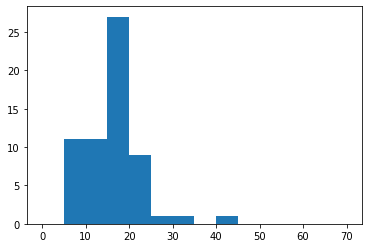

In [5]:
plt.hist([int(x) for x in l], bins = [0,5,15,20,25,30,35,40,45,50,55,60,65,70])

In [6]:
max(l), min(l)

(42, 7)

In [7]:
# idx = 147
# s = train_datadict[idx]["start"]
# e = train_datadict[idx]["end"]
# print(s, e)

# im = torch.load(train_datadict[idx]["im"]).numpy()
# lbl = torch.load(train_datadict[idx]["lbl"]).numpy()

# fig, ax = plt.subplots(1,2)
# ax[0].imshow(im[:,(s+e)//2,:])
# ax[1].imshow(lbl[:,(s+e)//2,:])

In [8]:
# for d in pit_valid_datadict:
#     idx = all_filenames_pt.index((d["im"],d["lbl"]))
#     shape = im_datadict_pt[idx]["shape"]
#     print(shape)

In [9]:
# # Shapes

# def get_im_data(fn):
#     reader = sitk.ImageFileReader()

#     reader.SetFileName(fn)
#     reader.ReadImageInformation()

#     return (reader.GetSize(), reader.GetSpacing())

# im_data = [get_im_data(im_fn) for im_fn, seg_fn in all_filenames] # if os.path.basename(im_fn).startswith("pit")]
# print(len(im_data))

# from statistics import median

# def get_med(tuple_lst, i):
#     l = [o[i] for o in tuple_lst]
#     return median(l), min(l), max(l)

# print("Median/Min/Max Size 0: ", get_med([o[0] for o in im_data], 0))
# print("Median/Min/Max Size 1: ", get_med([o[0] for o in im_data], 1))
# print("Median/Min/Max Size 2: ", get_med([o[0] for o in im_data], 2))

In [10]:
# im_datadict = [{"spacing": sp, "shape": shape, "im": all_filenames_pt[i][0], "lbl": all_filenames_pt[i][1]} 
#                for i, (shape, sp) in enumerate(im_data)]
# print(*im_datadict, sep="\n")

In [11]:
# # Save
# with open(root + 'pitmri/' + 'las_nii_im_datadict_pt.pkl', 'wb') as f:
#     pickle.dump(im_datadict, f)

In [12]:
# print(*enumerate(im_data), sep="\n")

In [13]:
# # Viz 139

# selected = all_filenames[:5] + all_filenames[-5:]
# print(*selected, sep="\n")

# datadict = [{"im": im, "lbl":lbl} for im,lbl in selected]


# #min_pixdim = (0.2734000086784363, 1.7000000476837158, 0.2734000086784363)
# #min_pixdim = (1, 1, 1)

# ds = []

# for d in datadict:
#     d1 = LoadImaged(keys=["im", "lbl"])(d)
#     ds.append(d1)
# #d2 = Spacingd(keys=["im","lbl"], pixdim=min_pixdim, mode=("bilinear", "nearest"))(d1)

In [14]:
# fig, axes = plt.subplots(10, 3, figsize=(60,60))
# #fig.suptitle('Horizontally stacked subplots')

# for i,ax in enumerate(axes):
#     im = ds[i]["im"]
#     ax[0].imshow(np.take(im, im.shape[0]//2, axis=0))
#     ax[1].imshow(np.take(im, im.shape[1]//2, axis=1))
#     ax[2].imshow(np.take(im, im.shape[2]//2, axis=2))

In [15]:
# def print_shapes(all_shapes):
#     print("Shapes of tensors")

#     print("Dim 0")
#     print(min(all_shapes, key=lambda s: s[0]))
#     print(max(all_shapes, key=lambda s: s[0]))

#     print("Dim 1")
#     print(min(all_shapes, key=lambda s: s[1]))
#     print(max(all_shapes, key=lambda s: s[1]))

#     print("Dim 2")
#     print(min(all_shapes, key=lambda s: s[2]))
#     print(max(all_shapes, key=lambda s: s[2]))
    
# print_shapes(all_shapes)

In [16]:
def mask2bbox_pt(mask):
    """Returns bounding box coordinates of binary mask"""
    k = torch.any(torch.any(mask, dim=0), dim=0) # 0 -> 1,2 -> 1 -> 2 left
    j = torch.any(torch.any(mask, dim=0), dim=1) # 0 -> 1,2 -> 2 -> 1 left
    i = torch.any(torch.any(mask, dim=1), dim=1) # 1 -> 0,2 -> 0 -> 0 left
    
    imin, imax = torch.where(i)[0][[0, -1]]
    jmin, jmax = torch.where(j)[0][[0, -1]]
    kmin, kmax = torch.where(k)[0][[0, -1]]
    
    # inclusive indices
    return torch.tensor([imin, imax+1, jmin, jmax+1, kmin, kmax+1])

def sitk2np(obj): return np.swapaxes(sitk.GetArrayFromImage(obj), 0, 2)
def np2sitk(arr): return sitk.GetImageFromArray(np.swapaxes(arr, 0, 2))

def torch2sitk(t): return sitk.GetImageFromArray(torch.transpose(t, 0, 2))
def sitk2torch(o): return torch.transpose(torch.tensor(sitk.GetArrayFromImage(o)), 0, 2)


def load_pt_6ch(x):
    d = {}
    im_fn, lbl_fn, start, end = x["im"], x["lbl"], x["start"], x["end"]
    
    # index first 2 slices, mid 2 slices, last 2 slices. min is 7
    mid = torch.div(start+end, 2, rounding_mode='trunc') # (start+end)//2
    idx1 = torch.tensor([start, start+1, mid, mid+1, end-2, end-1])

    # bring 6 channels to first dim eg 6x180x180
    d["im"]  = torch.load(im_fn)[:,idx1,:].squeeze().transpose(0,1)
    d["lbl"] = torch.load(lbl_fn)[:,idx1,:].squeeze().transpose(0,1)

    return d

def load_pt_1ch(x):
    d = {}
    im_fn, lbl_fn, start, end = x["im"], x["lbl"], x["start"], x["end"]
    
    # index first 2 slices, mid 2 slices, last 2 slices. min is 7
    #mid = (start+end)//2
    mid = torch.div(start+end, 2, rounding_mode='trunc') # (start+end)//2
    #idx1 = torch.tensor([start, start+1, mid, mid+1, end-2, end-1])

    # bring 6 channels to first dim eg 6x180x180
    d["im"]  = torch.load(im_fn)[:,mid,:].squeeze()
    d["lbl"] = torch.load(lbl_fn)[:,mid,:].squeeze()

    return d

# loni_bboxs = []
# for im_fn, lbl_fn in loni_filenames:
#     lbl = sitk.ReadImage(lbl_fn, sitk.sitkUInt8)
#     bbox = mask2bbox_pt(sitk2torch(lbl))
#     loni_bboxs.append({"im": im_fn, "lbl": lbl_fn, "bbox": bbox})

In [20]:
def get_stem_name_pt(fn):
    basename = os.path.basename(fn)
    return basename[:basename.index(".pt")]

#get_stem_name_pt(all_filenames_pt[0][0])

In [21]:
# # for loni, add info on start/end
# def add_coronal_info_2(lst):
#     for i,(im_fn,lbl_fn) in enumerate(lst):
#         item    = (im_fn,lbl_fn)
#         is_loni = ("loni" in im_fn)
        
#         # add coronal slices as seperate items
#         if is_loni:
#             loni_bbox = loni_bboxs[loni_filenames.index(item)]["bbox"]
#             start = loni_bbox[2]
#             end   = loni_bbox[3]
#         else:
#             shape = im_datadict_pt[all_filenames_pt.index(item)]["shape"]        
#             start = 0
#             end   = shape[1]
        
    
#         im = torch.load(im_fn)
#         lbl = torch.load(lbl_fn)

#         basename_im = get_stem_name_pt(im_fn)
#         basename_lbl = get_stem_name_pt(lbl_fn)
        
#         for i in range(start, end):
#             imf  = root + f'pitmri/las_pt_slices/' + basename_im + slice_{i} + '.pt'
#             lblf = root + f'pitmri/las_pt_slices/' + basename_lbl + slice_{i} + '.pt'

#             torch.save(im[:,i,:], imf)
#             torch.save(lbl[:,i,:], lblf)

# add_coronal_info_2(all_filenames_pt)

In [22]:
# for im_fn, lbl_fn in all_filenames:
#     im  = sitk.ReadImage(im_fn, sitk.sitkFloat32)
#     lbl = sitk.ReadImage(lbl_fn, sitk.sitkUInt8)
    
#     impt = sitk2torch(im)
#     lblpt = sitk2torch(lbl)
    
#     basename_im = get_stem_name(im_fn)
#     basename_lbl = get_stem_name(lbl_fn)
    
#     torch.save(impt, root + 'pitmri/las_pt/' + basename_im + '.pt')
#     torch.save(lblpt, root + 'pitmri/las_pt/' + basename_lbl + '.pt')


In [23]:
# all_filenames_pt = []

# for im_fn, lbl_fn in all_filenames:
 
#     basename_im = get_stem_name(im_fn)
#     basename_lbl = get_stem_name(lbl_fn)
    
#     imfn = root + 'pitmri/las_pt/' + basename_im + '.pt'
#     lblfn = root + 'pitmri/las_pt/' + basename_lbl + '.pt'

#     all_filenames_pt.append((imfn, lblfn))
    
# # Save
# with open(root + 'pitmri/' + 'all_filenames_pt.pkl', 'wb') as f:
#     pickle.dump(all_filenames_pt, f)

In [24]:
# loni_bboxs_pt = [{"im": all_filenames_pt[i][0], "lbl": all_filenames_pt[i][1], "bbox": loni_bboxs[i]["bbox"]} for
#                  i in range(len(loni_filenames))]

In [25]:
# # Save
# with open(root + 'pitmri/' + 'loni_bboxs_pt.pkl', 'wb') as f:
#     pickle.dump(loni_bboxs_pt, f)

In [26]:
# # Shapes
# loni_shapes = []
# for d in loni_train_datadict:
#     item_d = load_pt(d)
#     sh = tuple(item_d["lbl"].shape)
#     loni_shapes.append(sh)
#     print(sh)

In [27]:
# print_shapes(loni_shapes)

# Transforms

In [60]:
largest_sz_pit     = (576, 42, 640)
largest_sz_loni    = (256, 68, 512)

largest_sz         = (640, 640)
center_crop_sz     = (144, 144)

In [61]:
train_datadict[1]

{'im': '/home/gologors/data/pitmri/las_pt/pit_im_2.25.136122090940539320905329439584917076786_PIT_COR_T1_F_S_PRE_20161208123708_901.pt',
 'lbl': '/home/gologors/data/pitmri/las_pt/pit_lbl_2.25.136122090940539320905329439584917076786_PIT_COR_T1_F_S_PRE_20161208123708_901.pt',
 'start': 0,
 'end': 14}

In [62]:
# Transforms
from helpers.transforms_simplified import UndoDict

keys=["im", "lbl"]

train_transforms = Compose(
    [
        load_pt_1ch,
        NormalizeIntensityd(keys=["im"], nonzero=True, channel_wise=False),
        AddChanneld(keys=keys),
        SpatialPadd(keys=keys, spatial_size=largest_sz, method="symmetric", mode="constant"),
        CenterSpatialCropd(keys=keys, roi_size=center_crop_sz),
        UndoDict(keys=["im", "lbl"])
    ]
)

valid_transforms = train_transforms

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


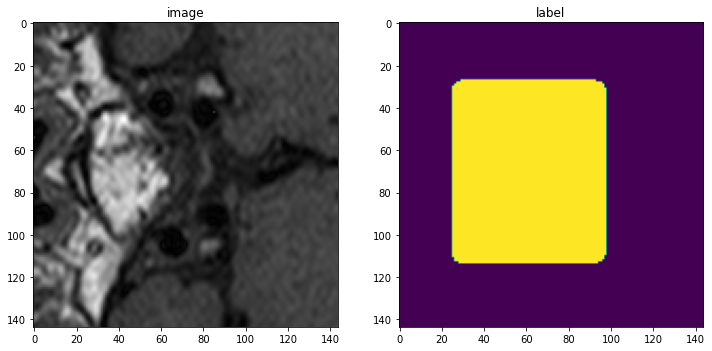

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


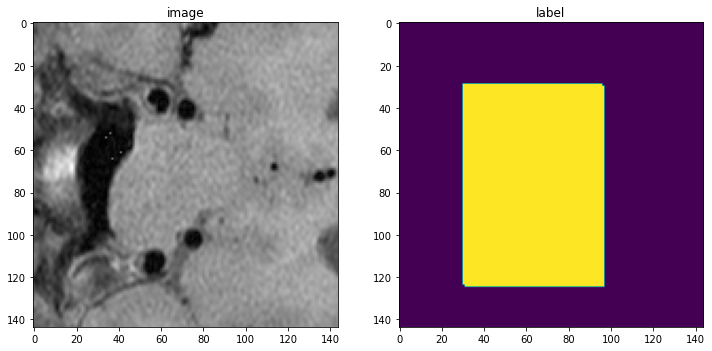

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


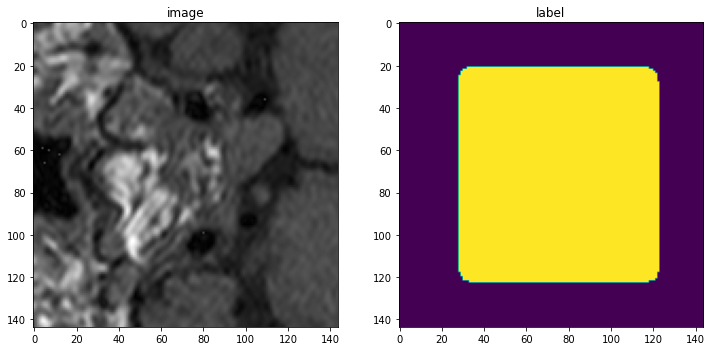

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


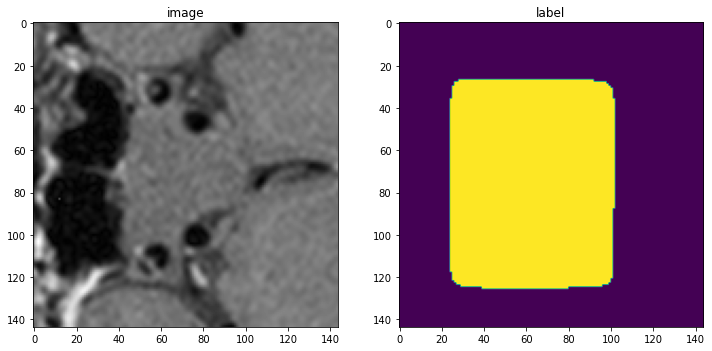

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


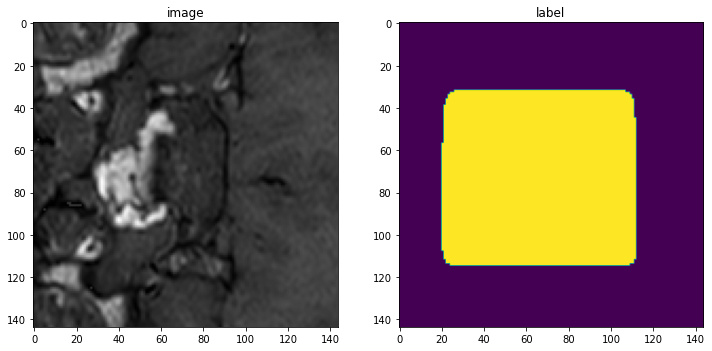

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


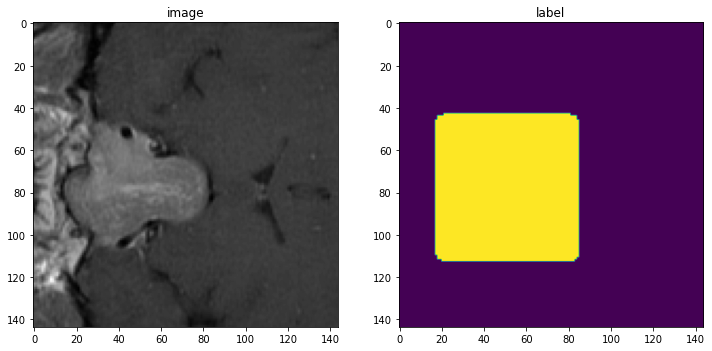

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


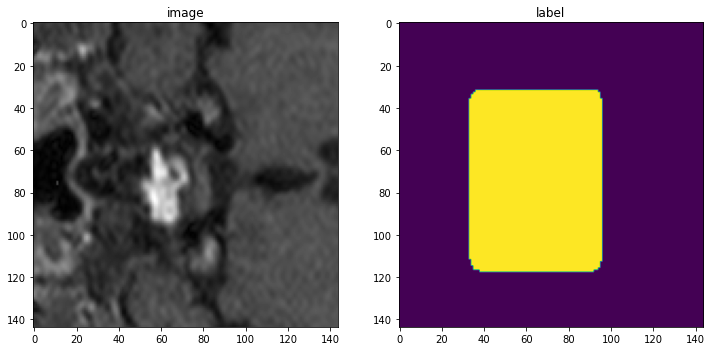

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


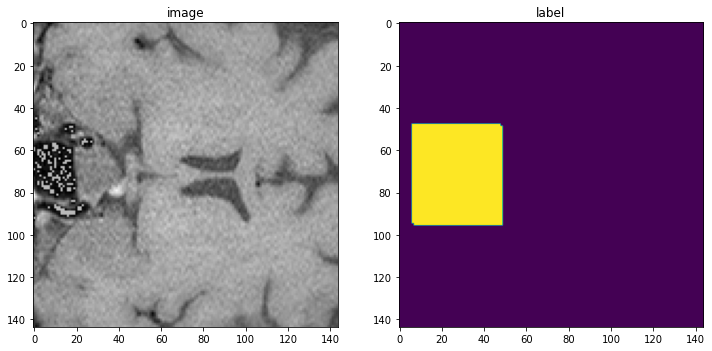

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


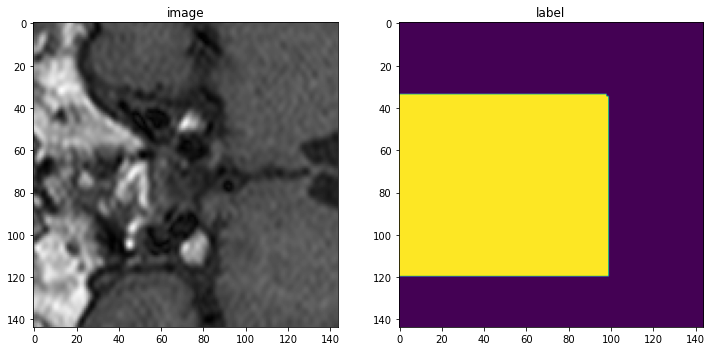

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


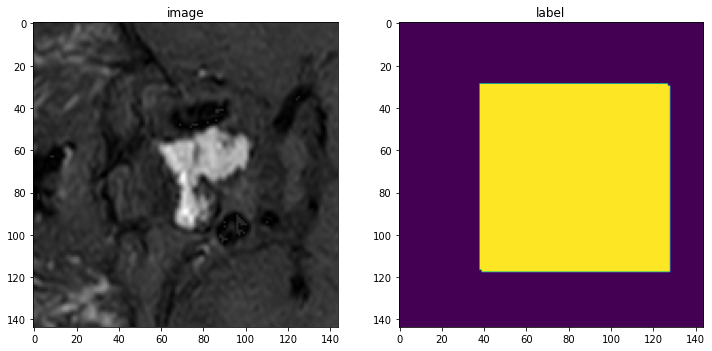

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


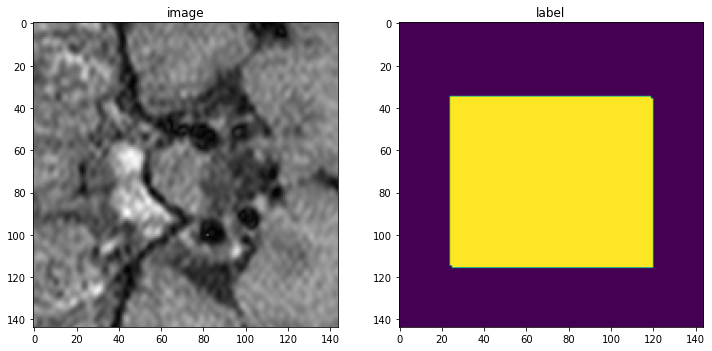

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


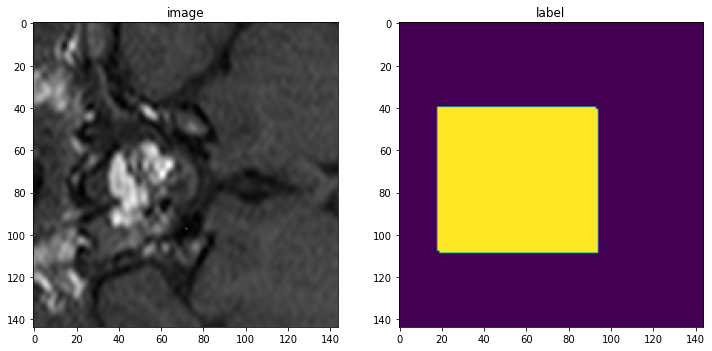

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


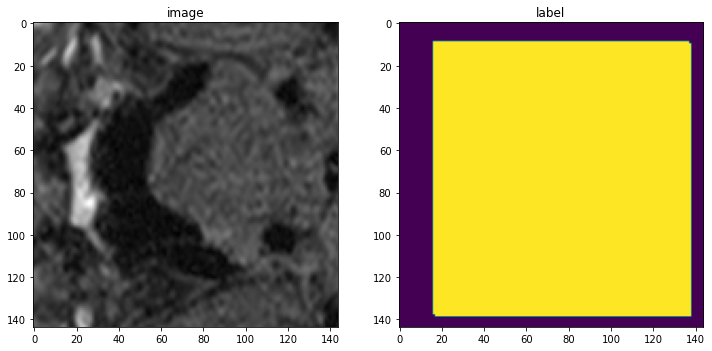

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


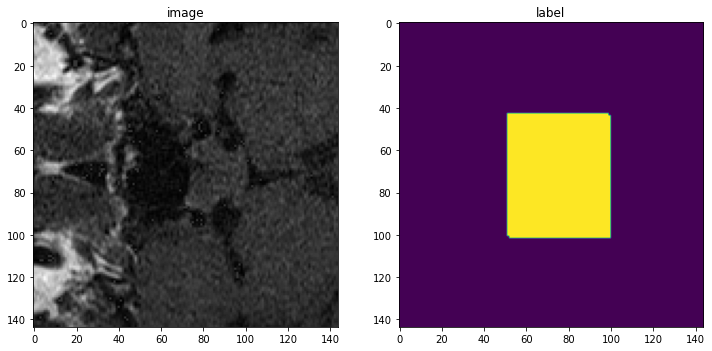

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


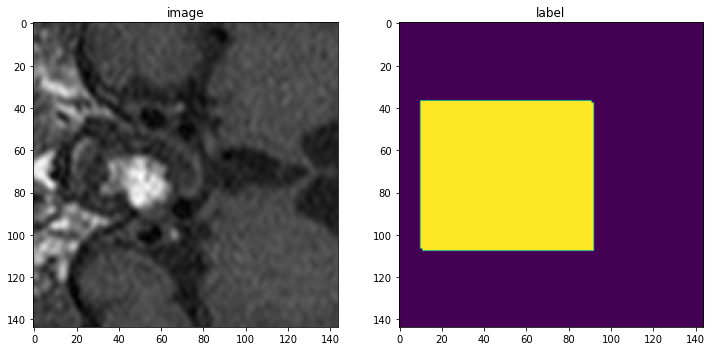

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


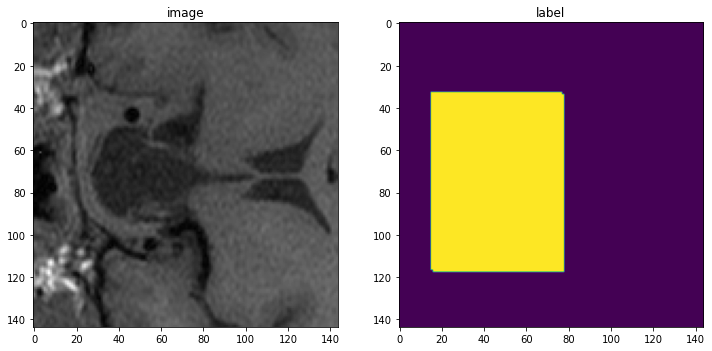

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


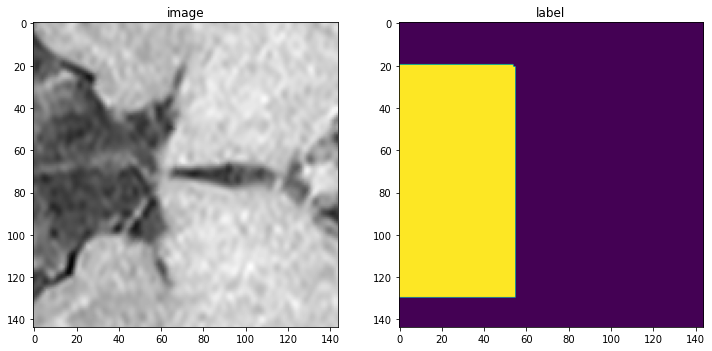

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


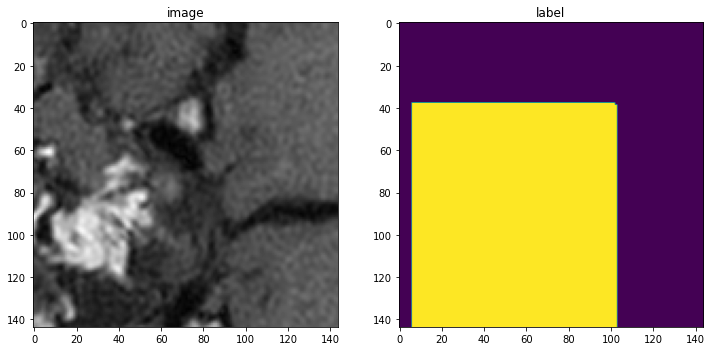

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


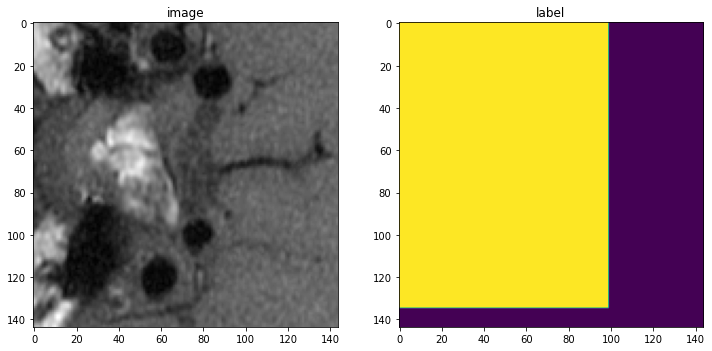

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


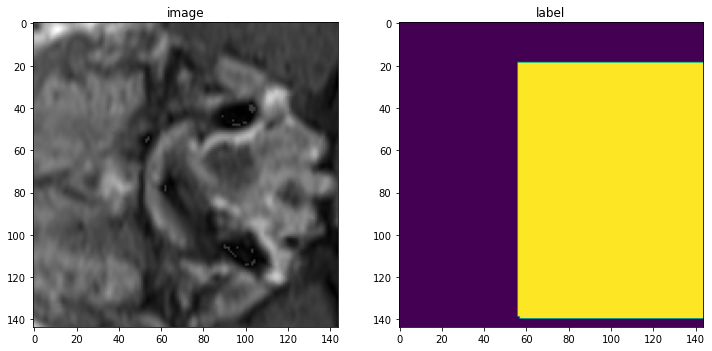

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


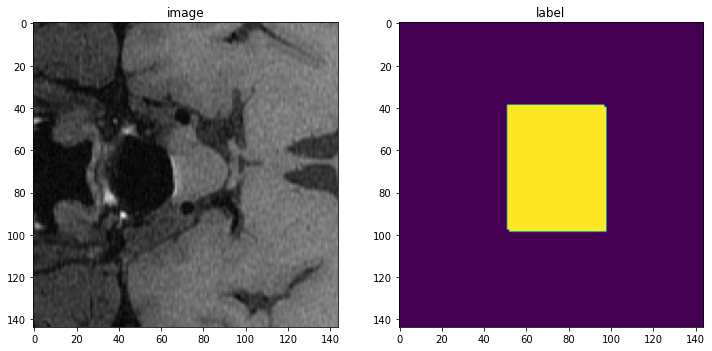

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


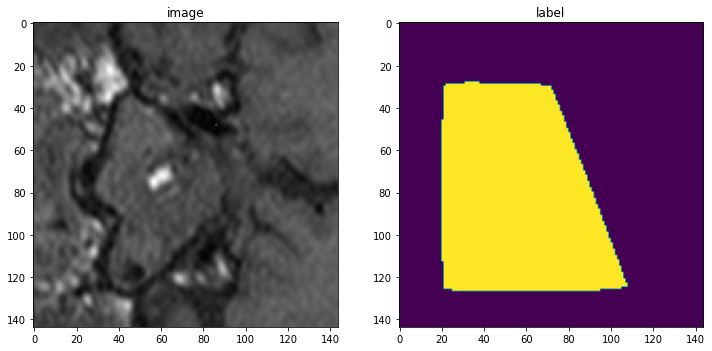

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


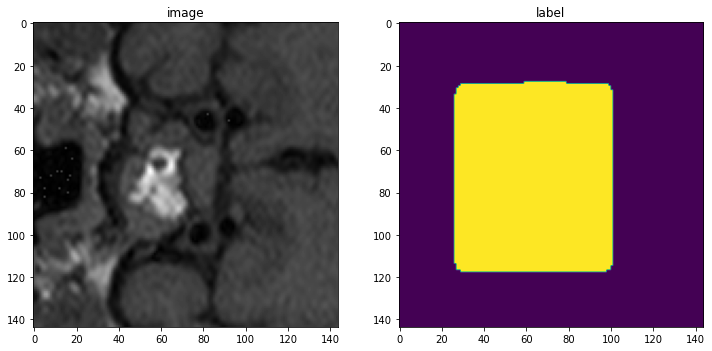

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


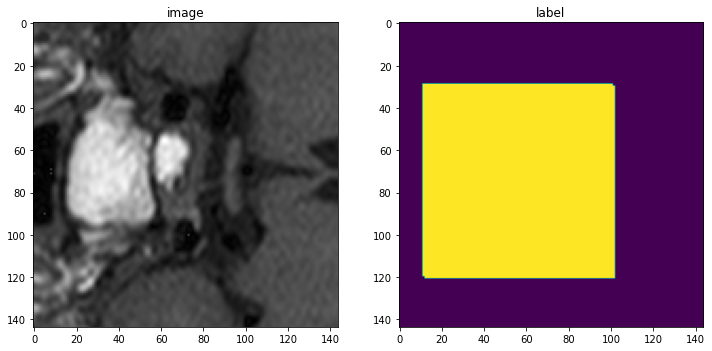

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


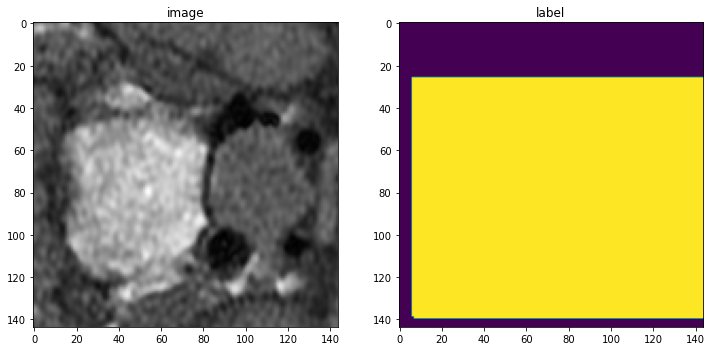

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


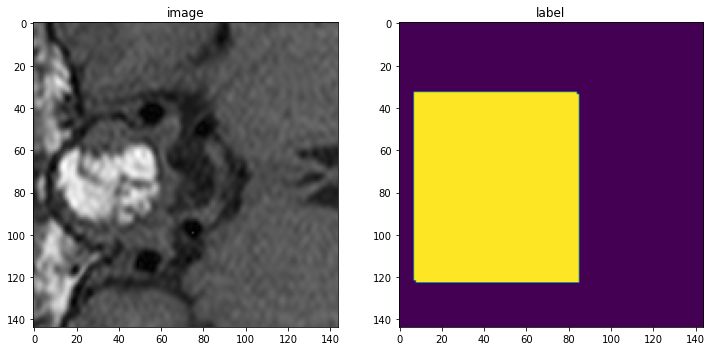

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


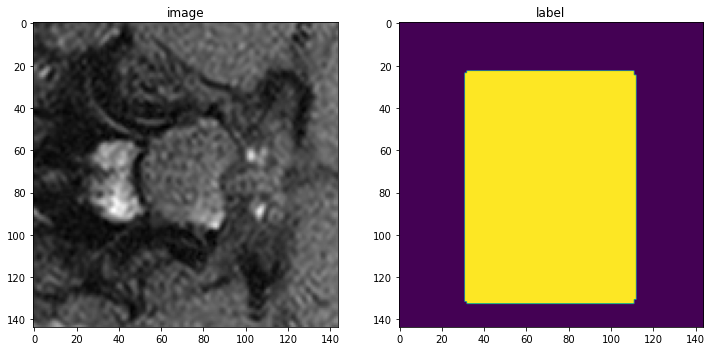

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


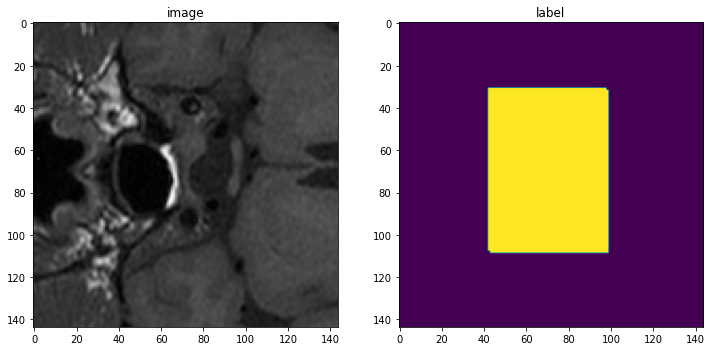

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


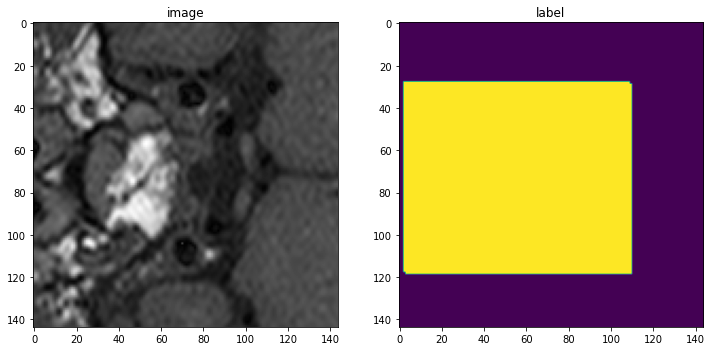

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


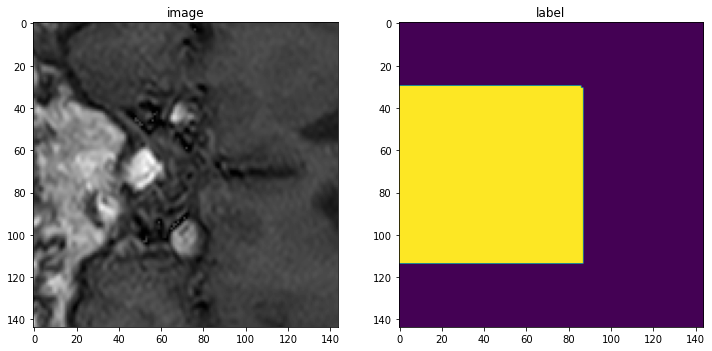

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


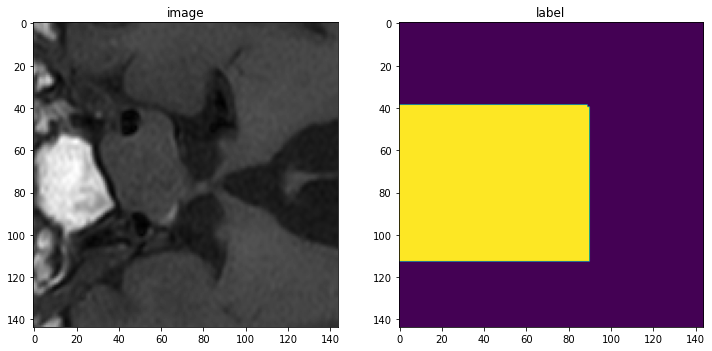

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


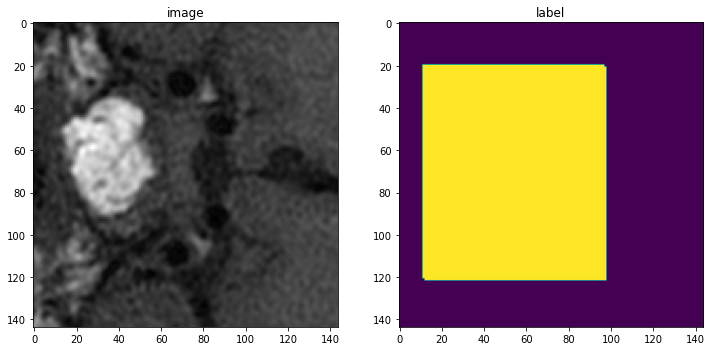

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


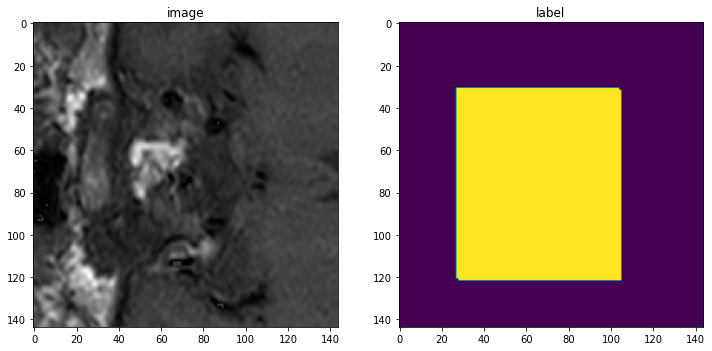

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


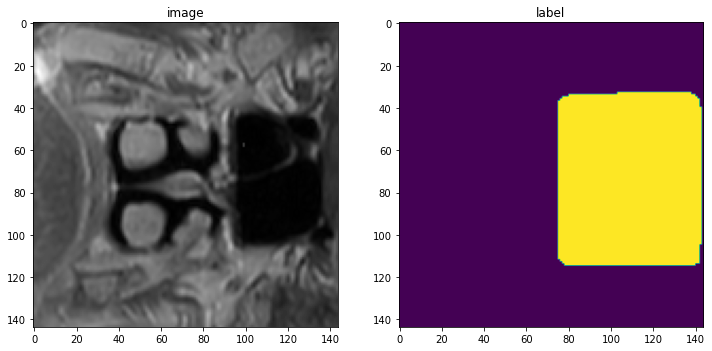

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


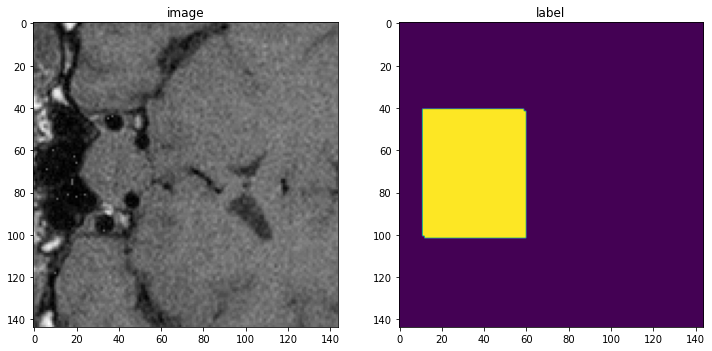

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


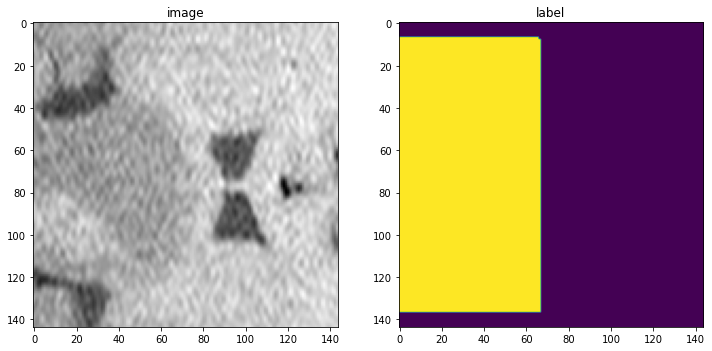

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


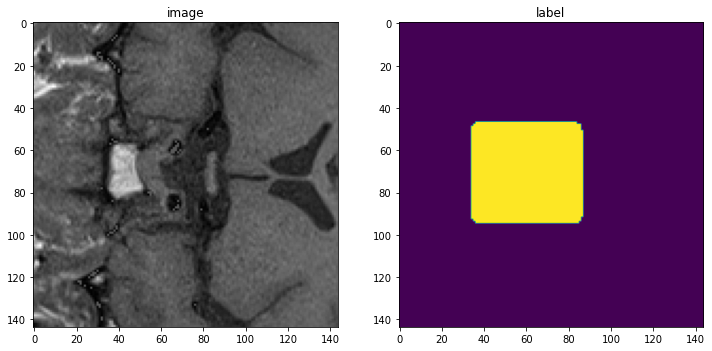

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


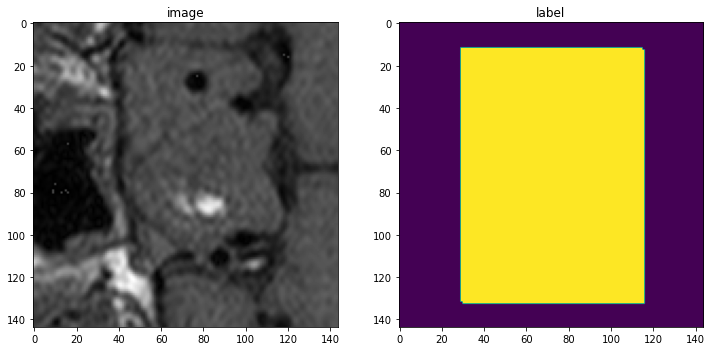

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


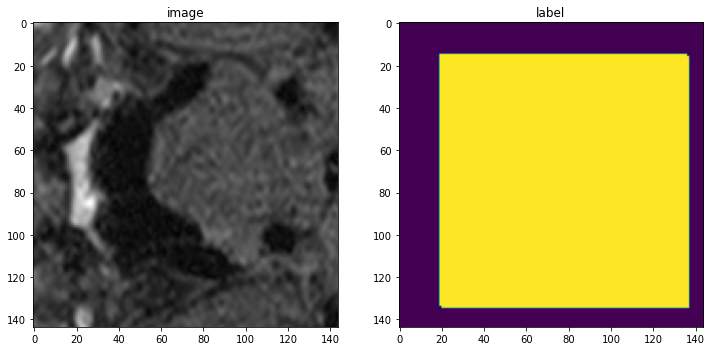

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


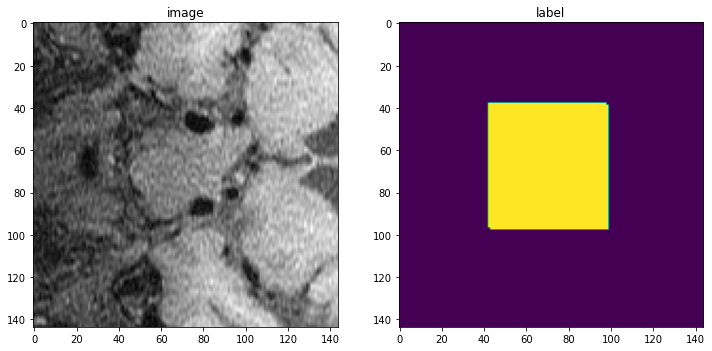

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


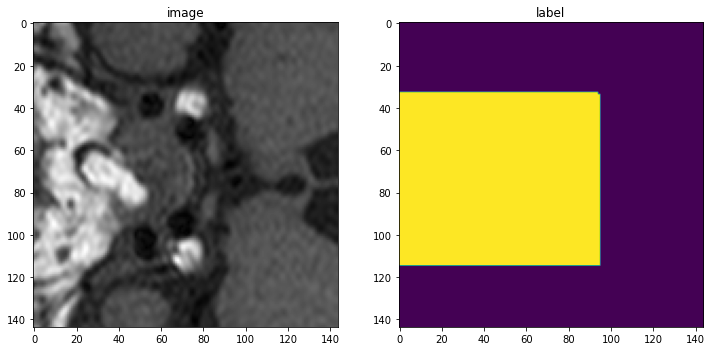

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


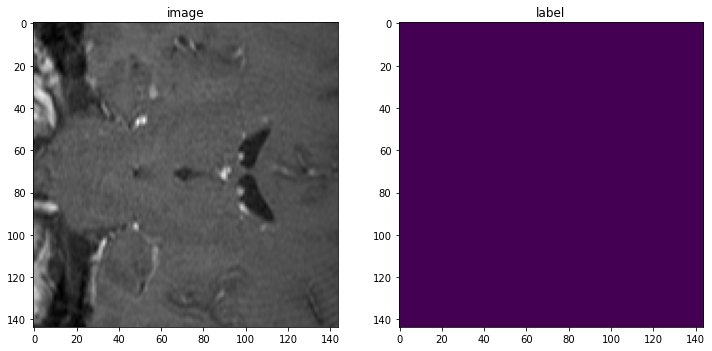

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


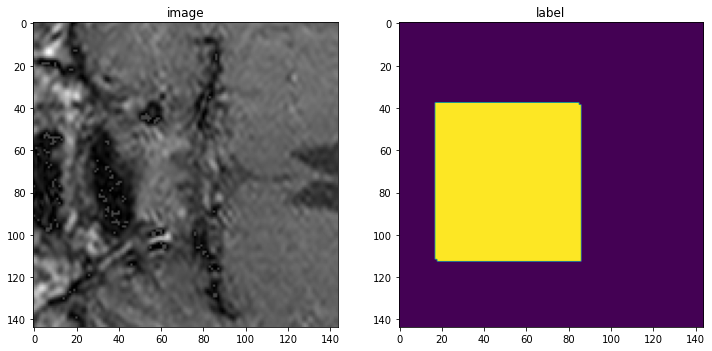

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


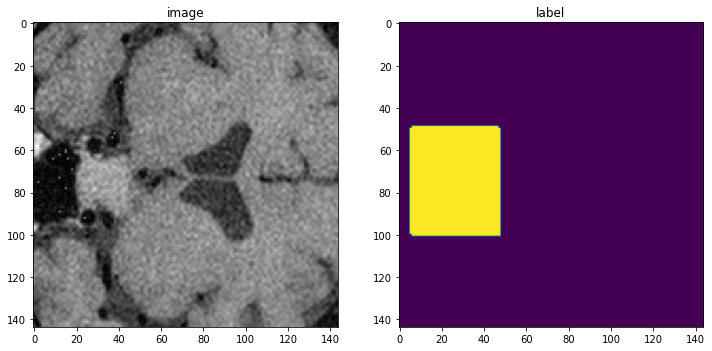

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


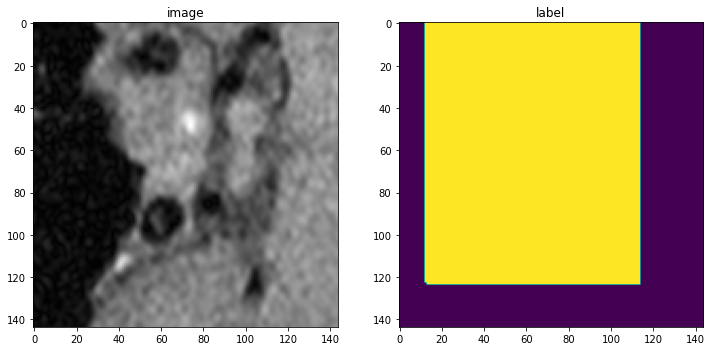

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


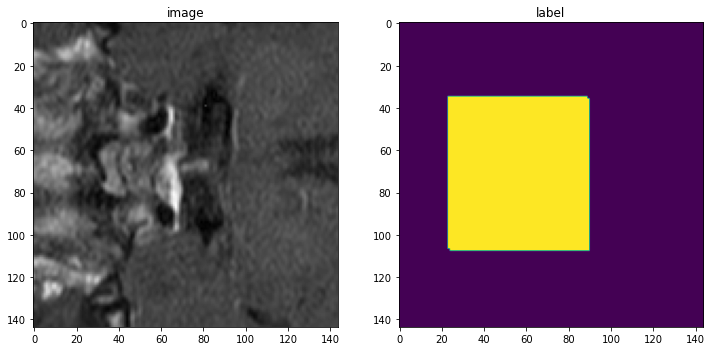

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


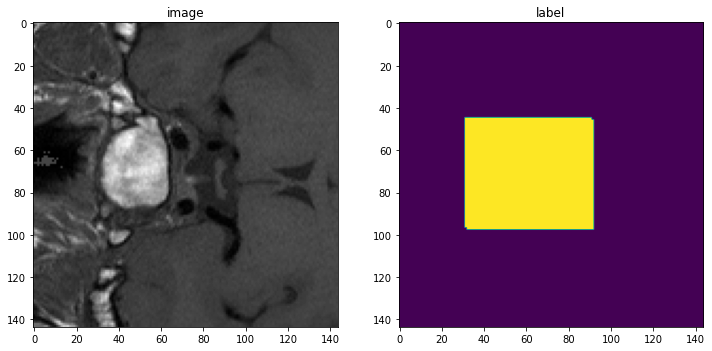

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


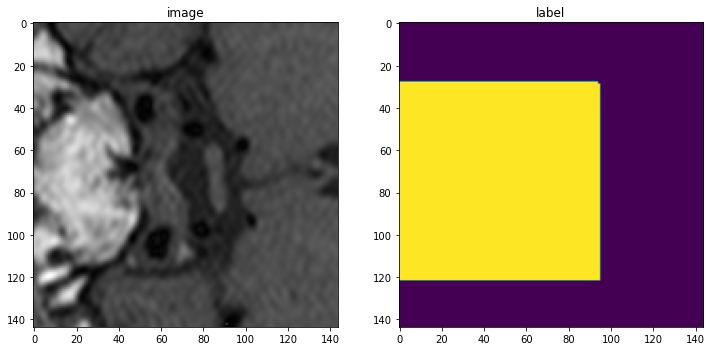

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


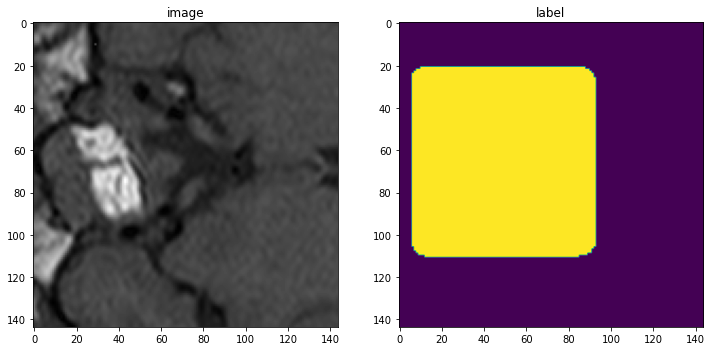

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


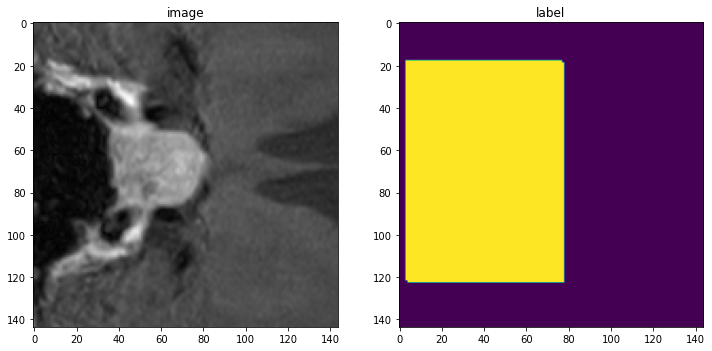

In [63]:
# Transforms


valid_ds = Dataset(data=train_datadict + valid_datadict, transform=valid_transforms)
valid_loader = DataLoader(valid_ds, batch_size=1)

count_ims = 0
for check_data in valid_loader:
    image, label = (check_data[0][0][0], check_data[1][0][0])
    print(f"image shape: {image.shape}, label shape: {label.shape}")
    # plot the slice [:, :, 21]
    plt.figure("check", (12, 6))
    plt.subplot(1, 2, 1)
    plt.title("image")
    plt.imshow(image, cmap="gray")
    plt.subplot(1, 2, 2)
    plt.title("label")
    plt.imshow(label)
    plt.show()
    
    count_ims += 1
    
#     if count_ims == 30:
#         break

#valid_loader = DataLoader(valid_ds, batch_size=1, shuffle=True, num_workers=2)

In [37]:
check_ds = Dataset(data=valid_datadict, transform=valid_transforms)
check_loader = DataLoader(check_ds, batch_size=2)

In [ ]:
count_ims = 0
for check_data in check_loader:
    print(check_data[0].shape)
    image, label = check_data[0][1][0], check_data[1][1][0] #(check_data["im"][0][0], check_data["lbl"][0][0])
    print(f"image shape: {image.shape}, label shape: {label.shape}")
    #plot the slice [:, :, 21]
    plt.figure("check", (12, 6))
    plt.subplot(1, 2, 1)
    plt.title("image")
    plt.imshow(image, cmap="gray")
    plt.subplot(1, 2, 2)
    plt.title("label")
    plt.imshow(label)
    plt.show()
    
    count_ims += 1
    
    if count_ims == 3:
        break

In [ ]:
train_datadict[0]

In [ ]:
load_pt_6ch(train_datadict[1])["lbl"].shape

In [ ]:
idx1 = torch.tensor([ 0,  1,  8,  9, 14, 15])

im = torch.load(train_datadict[9]["im"])
im2 = im[:,idx1,:].squeeze()

In [ ]:
im2.shape

In [ ]:
count_ims = 0

fns = [valid_datadict[0], train_datadict[0], train_datadict[100]]

for fn in fns:
    data = valid_transforms(fn)
    print(data[0][0].shape)
    image, label = data[0][0], data[1][0] #(check_data["im"][0][0], check_data["lbl"][0][0])
    print(os.path.basename(fn["im"]))
    
    print(f"image shape: {image.shape}, label shape: {label.shape}")
    #plot the slice [:, :, 21]
    plt.figure("check", (12, 6))
    plt.subplot(1, 2, 1)
    plt.title("image")
    plt.imshow(image, cmap="gray")
    plt.subplot(1, 2, 2)
    plt.title("label")
    plt.imshow(label)
    plt.show()
    
    count_ims += 1
    
    if count_ims == 3:
        break

In [64]:
# Fastai + distributed training
from fastai              import *
from fastai.torch_basics import *
from fastai.basics       import *
from fastai.distributed  import *
from fastai.callback.all import SaveModelCallback, CSVLogger, ProgressCallback

# clear cache
torch.cuda.empty_cache()

from helpers.general import print_hardware_stats
print_hardware_stats()

#GPU = 1, #CPU = 16
GPU NVIDIA TITAN V       RAM Free: 10801MB | Used: 1265MB | Util  10% | Total 12066MB


In [65]:
# clear cache
torch.cuda.empty_cache()

In [66]:
bs = 10

train_dl = TfmdDL(train_datadict, after_item=train_transforms, after_batch=[], bs=bs)
val_dl   = TfmdDL(valid_datadict,   after_item=valid_transforms,   after_batch=[], bs=bs)


dls = DataLoaders(train_dl, val_dl)
dls = dls.cuda()

In [67]:
# PRETRAINED = False

# if PRETRAINED:
#      unet_path = f"/home/gologors/pitmri/PituitaryGenerator/unet/model.pth"
#      checkpoint = torch.load(unet_path)

In [68]:
# print(checkpoint.keys())
# print(checkpoint["opt"].keys())

In [69]:
# UNET model

# 5 layer network with simple convolution/normalization/dropout/activation blocks defining the layers
model = UNet(
    spatial_dims=2,
    in_channels=1,
    out_channels=2,
    channels=(4, 8, 16, 32, 64),
    strides=(2, 2, 2, 2),
)

# model = UNet(
#             dimensions=3,
#             in_channels=1,
#             out_channels=2,
#             channels=(16, 32, 64, 128, 256),
#             strides=(2, 2, 2, 2),
#             num_res_units=2,
#             dropout=0.0,
#         )

In [70]:
# # copy all the pretrained weights except for variables whose name matches "model.0.conv.unit0"
# pretrained_dict, updated_keys, unchanged_keys = copy_model_state(
#     model, checkpoint["model"])

# print("num. var. using the pretrained", len(updated_keys), ", random init", len(unchanged_keys), "variables.")
# model.load_state_dict(pretrained_dict)

# print([x[0] for x in model.named_parameters()])
# print(unchanged_keys)

# # # copy all the pretrained weights except for variables whose name matches "model.0.conv.unit0"
# # pretrained_dict, updated_keys, unchanged_keys = copy_model_state(
# #     model, checkpoint["model"], exclude_vars="model.0.conv.unit0")
# # print("num. var. using the pretrained", len(updated_keys), ", random init", len(unchanged_keys), "variables.")
# # model.load_state_dict(pretrained_dict)

# # print([x[0] for x in model.named_parameters()])
# # print(unchanged_keys)

# # # stop gradients for the pretrained weights
# # for x in model.named_parameters():
# #     if x[0] in updated_keys:
# #         x[1].requires_grad = False
# # params = generate_param_groups(
# #     network=model,
# #     layer_matches=[lambda x: x[0] in updated_keys],
# #     match_types=["filter"],
# #     lr_values=[1e-4],
# #     include_others=False
# # )

In [71]:
from fastai.vision.all import *

In [72]:
# # check
# print("Check")
# b = dls.one_batch()
# xb,yb = b #b["image"], b["label"]
# print(f"Batch: {len(b)}. xb: {xb.shape}, yb: {yb.shape}")
# predb = learn.model(xb)
# print(f"Pred batch: {predb.shape}")
# loss = loss_fn(predb, yb)
# print(f"Loss: {loss}")

In [73]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Device = ", device)

model = model.to(device)

Device =  cuda:0


In [74]:
from helpers.time import get_time_id

time_id = get_time_id()

print(time_id)

1653581449_Thu_May_26_2022_hr_12_min_10


In [75]:
model_src = f"/home/gologors/data/saved_models/finetune_learning_unet/fastai/unet2d_1ch/" + time_id
fig_src   = f"{model_src}/figs"
Path(fig_src).mkdir(parents=True, exist_ok=True)

In [76]:
print(model_src)

/home/gologors/data/saved_models/finetune_learning_unet/fastai/unet2d_1ch/1653581449_Thu_May_26_2022_hr_12_min_10


In [77]:
# 2d
from helpers.losses import dice_loss, dice_score

loss_fn = dice_loss

In [78]:
# cbs
cbs = [
    Recorder(train_metrics=True), # False
    SaveModelCallback(monitor='valid_dice_score', with_opt=True), 
    CSVLogger(fname=f"{fig_src}/history.csv")
]

# learner
learn = Learner(dls   = dls, \
                model     = model, \
                loss_func = loss_fn, \
                metrics   = dice_score, \
                model_dir = model_src, \
                cbs       = [])

# remove post-recorder, add new cbs, to GPU
learn.remove_cbs(learn.cbs[1:])
learn.add_cb(ProgressCallback())
learn.add_cbs(cbs)
learn.model = learn.model.cuda()

In [79]:
# check
print("Check")
b = dls.one_batch()
xb,yb = b #b["image"], b["label"]
print(f"Batch: {len(b)}. xb: {xb.shape}, yb: {yb.shape}")
predb = learn.model(xb)
print(f"Pred batch: {predb.shape}")
loss = loss_fn(predb, yb)
print(f"Loss: {loss}")

Check
Batch: 2. xb: torch.Size([10, 1, 144, 144]), yb: torch.Size([10, 1, 144, 144])
Pred batch: torch.Size([10, 2, 144, 144])
Loss: 0.6454637050628662


In [80]:
learn.fit_one_cycle(60, 3e-3, wd=1e-4)

epoch,train_loss,train_dice_score,valid_loss,valid_dice_score,time
0,0.637604,0.257825,0.649433,0.294973,00:01
1,0.636697,0.264530,0.646907,0.304151,00:01
2,0.635446,0.274936,0.642912,0.320402,00:01
3,0.633625,0.291118,0.636721,0.343747,00:01
4,0.630931,0.317688,0.627284,0.381328,00:01
5,0.626967,0.358035,0.613453,0.434916,00:01
6,0.621254,0.412242,0.594277,0.499155,00:01
7,0.613315,0.480409,0.570431,0.565614,00:01
8,0.602710,0.559133,0.532522,0.662621,00:01
9,0.589116,0.646019,0.496740,0.724070,00:01


Better model found at epoch 0 with valid_dice_score value: 0.2949731945991516.
Better model found at epoch 1 with valid_dice_score value: 0.3041505515575409.
Better model found at epoch 2 with valid_dice_score value: 0.3204021453857422.
Better model found at epoch 3 with valid_dice_score value: 0.3437468707561493.
Better model found at epoch 4 with valid_dice_score value: 0.3813277781009674.
Better model found at epoch 5 with valid_dice_score value: 0.43491631746292114.
Better model found at epoch 6 with valid_dice_score value: 0.49915534257888794.
Better model found at epoch 7 with valid_dice_score value: 0.5656144618988037.
Better model found at epoch 8 with valid_dice_score value: 0.6626213788986206.
Better model found at epoch 9 with valid_dice_score value: 0.7240704298019409.
Better model found at epoch 10 with valid_dice_score value: 0.7438990473747253.
Better model found at epoch 11 with valid_dice_score value: 0.7728229761123657.
Better model found at epoch 14 with valid_dice_s

# Plot Loss and Metric

In [81]:
@delegates(subplots)
def save_plot_metrics(self: Recorder, nrows=None, ncols=None, figsize=None, **kwargs):
    metrics = np.stack(self.values)
    # 'train_loss', 'train_dice_score', 'valid_loss', 'valid_dice_score'
    names = self.metric_names[1:-1]
    print("Metric names: ", names)
    
    names_train = [n for n in names if n.startswith("train")]
    n = len(names_train)
    if nrows is None and ncols is None:
        nrows = int(math.sqrt(n))
        ncols = int(np.ceil(n / nrows))
    elif nrows is None: nrows = int(np.ceil(n / ncols))
    elif ncols is None: ncols = int(np.ceil(n / nrows))
    figsize = (ncols * 6, nrows * 4)
    fig, axs = subplots(nrows, ncols, figsize=figsize)
    for i, ax in enumerate(axs):
        name = names_train[i]
        n = name[name.index("_")+1:]
        valid_name = f"valid_{n}"
        valid_idx = names.index(valid_name)
        print(i, valid_idx, name, valid_name)
        ax.plot(metrics[:, i], color='#1f77b4',  label='train')
        ax.plot(metrics[:, valid_idx], color = '#ff7f0e', label='valid')
        ax.set_title(n)
        ax.legend(loc='best')
    #plt.show()
    plt.savefig(f'{fig_src}/metrics.png', bbox_inches='tight')
    plt.close()

In [82]:
save_plot_metrics(learn.recorder)

Metric names:  ['train_loss', 'train_dice_score', 'valid_loss', 'valid_dice_score']
0 2 train_loss valid_loss
1 3 train_dice_score valid_dice_score


image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


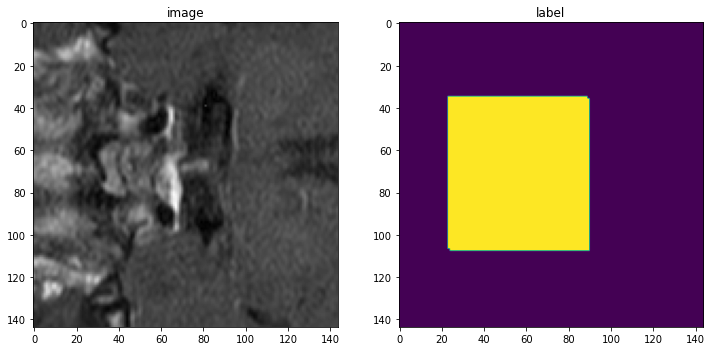

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


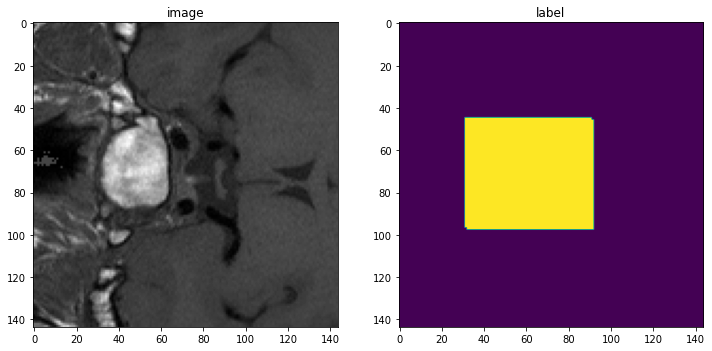

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


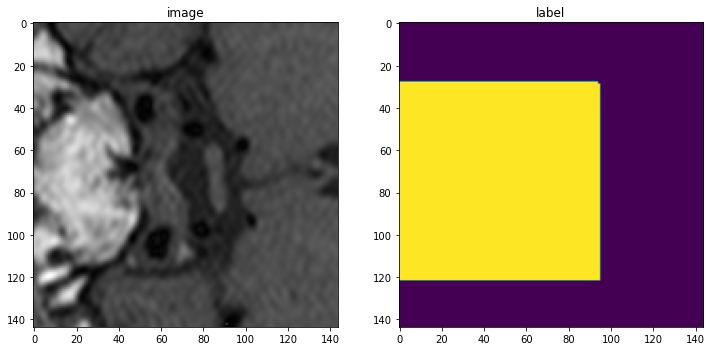

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


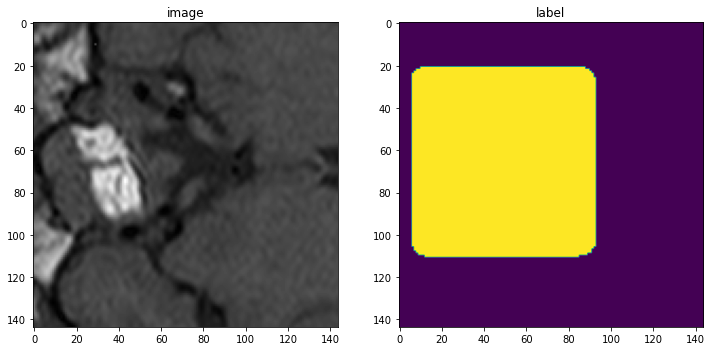

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


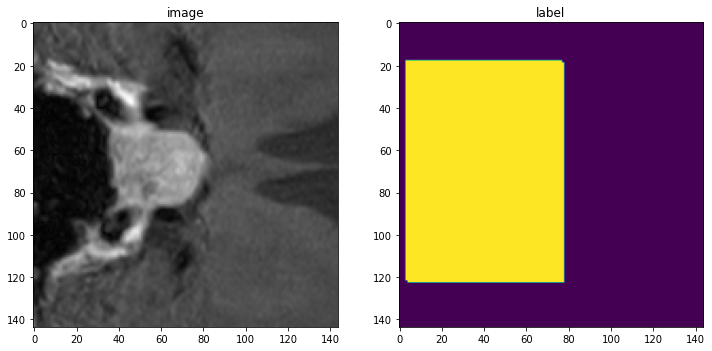

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


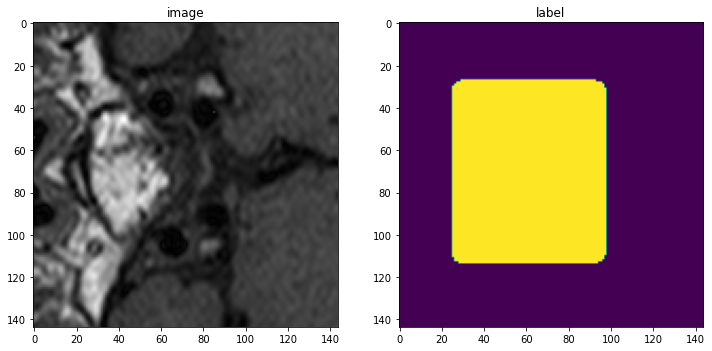

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


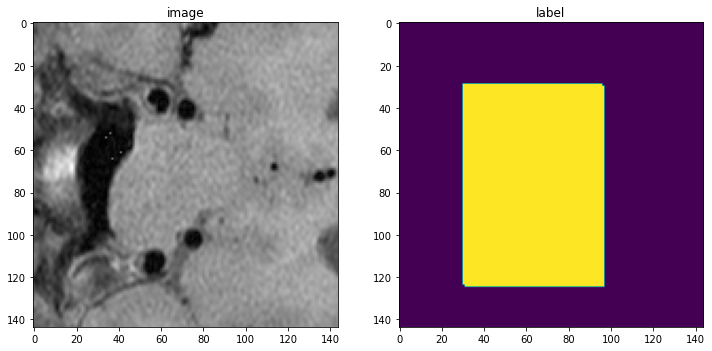

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


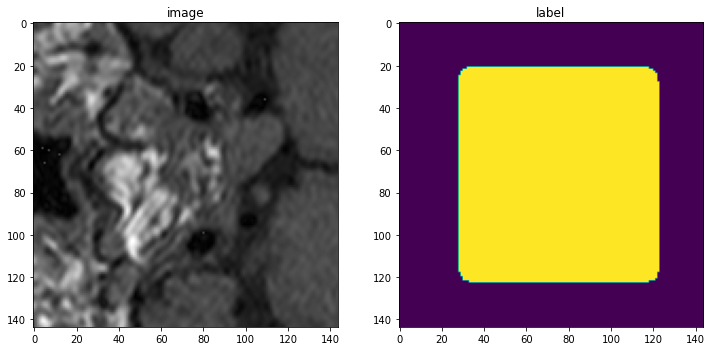

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


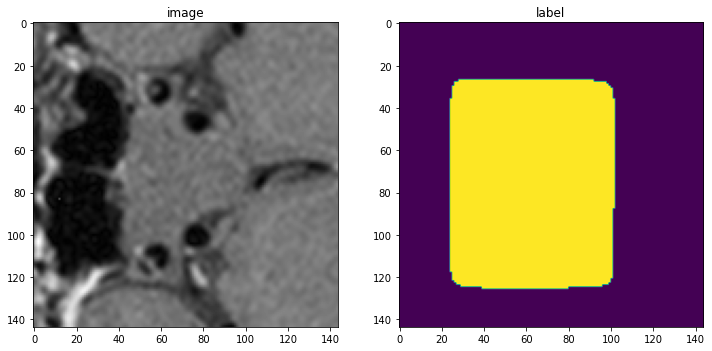

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


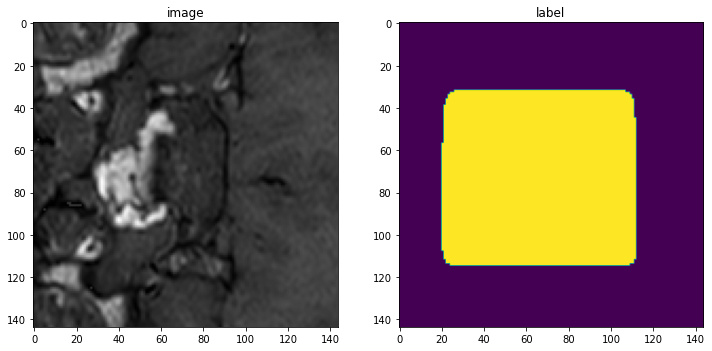

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


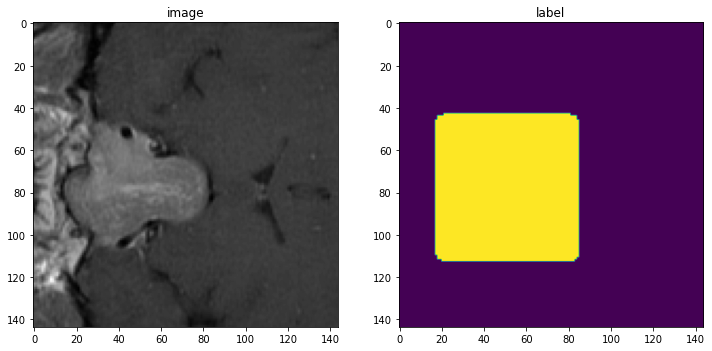

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


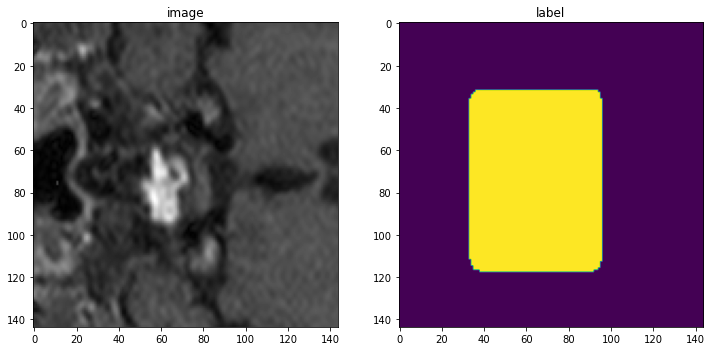

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


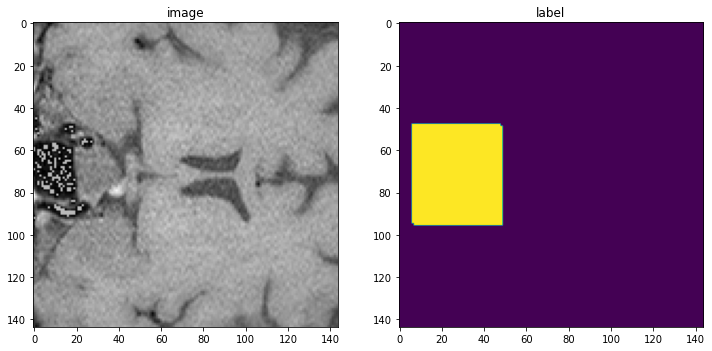

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


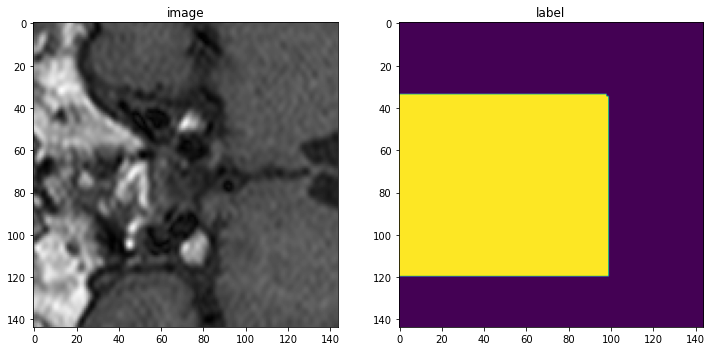

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


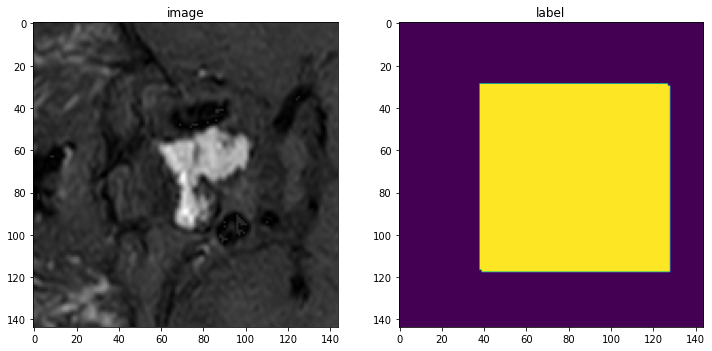

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


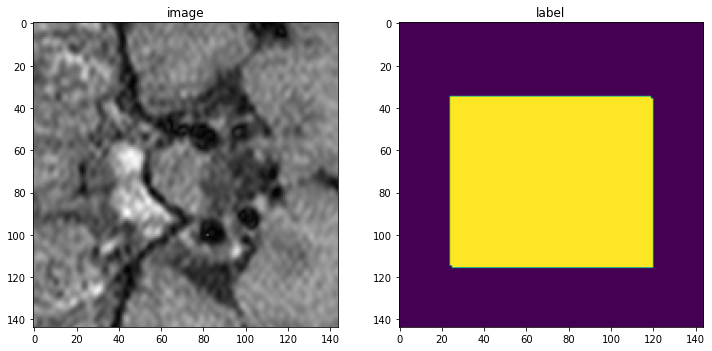

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


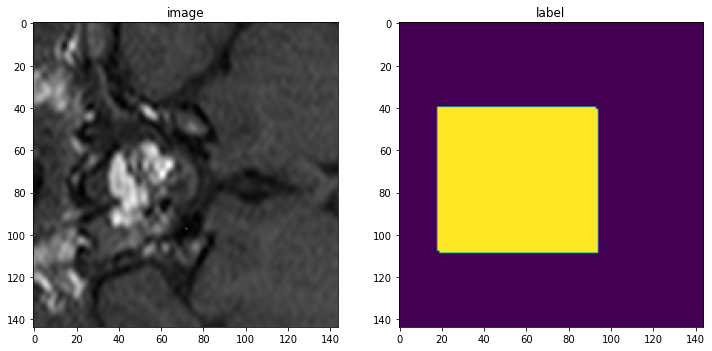

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


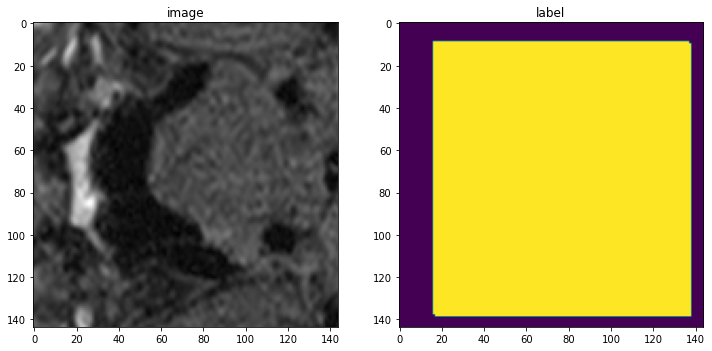

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


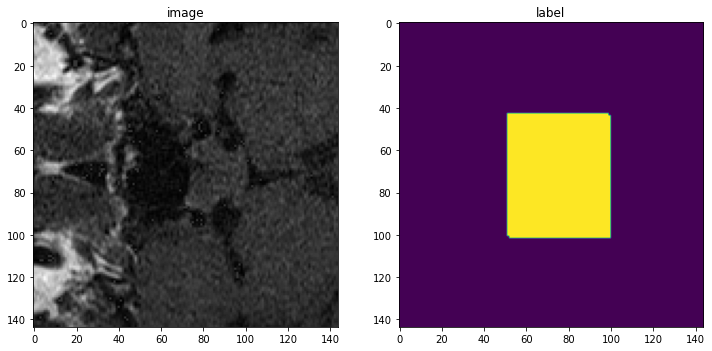

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


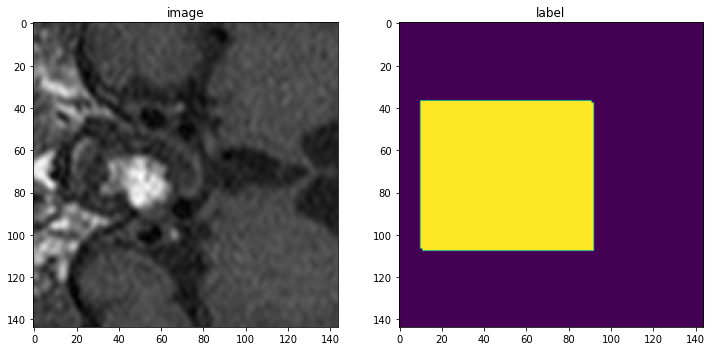

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


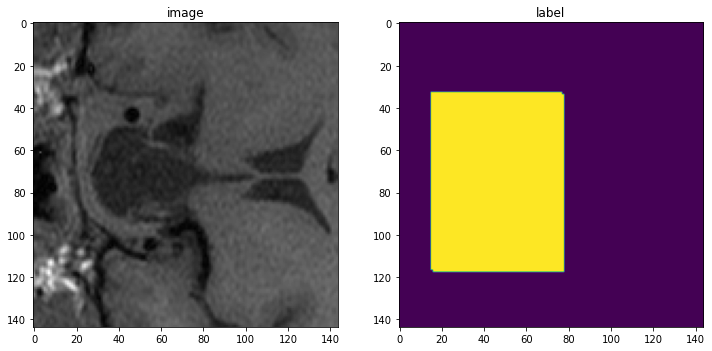

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


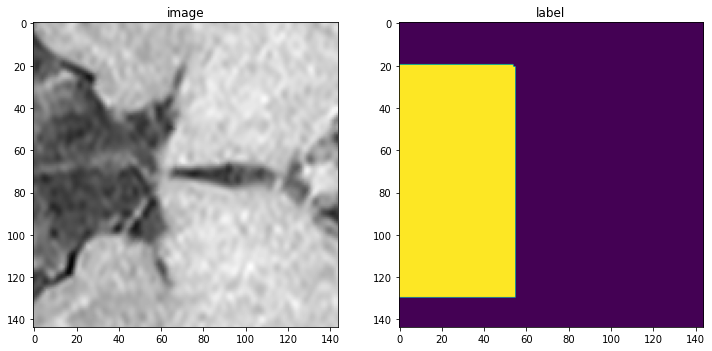

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


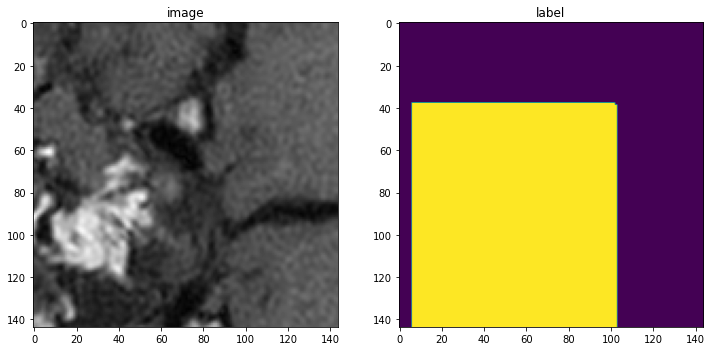

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


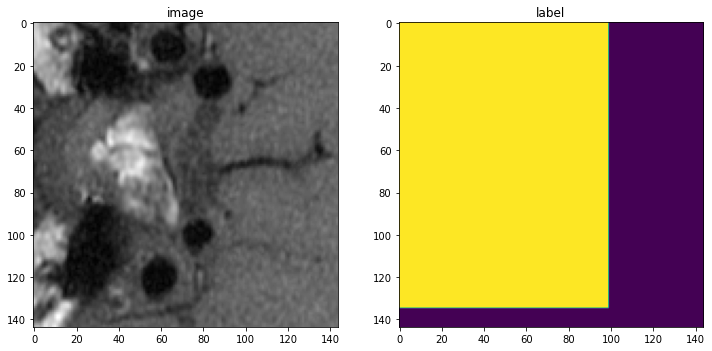

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


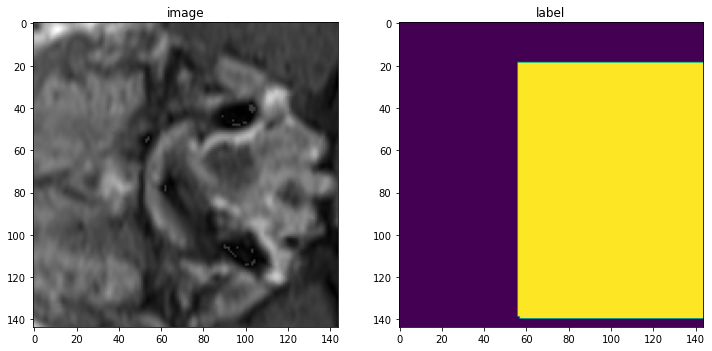

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


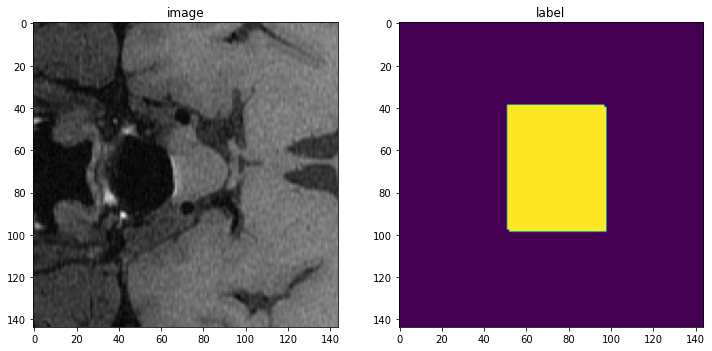

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


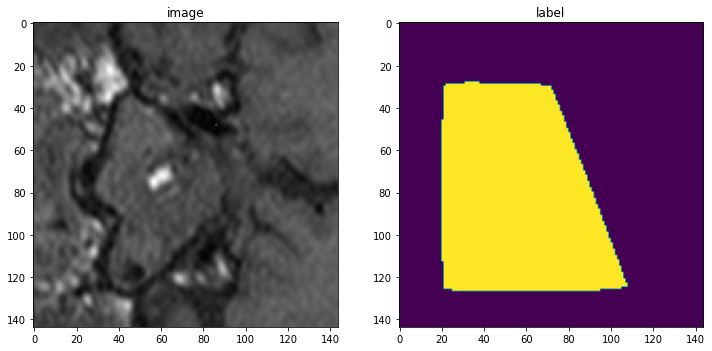

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


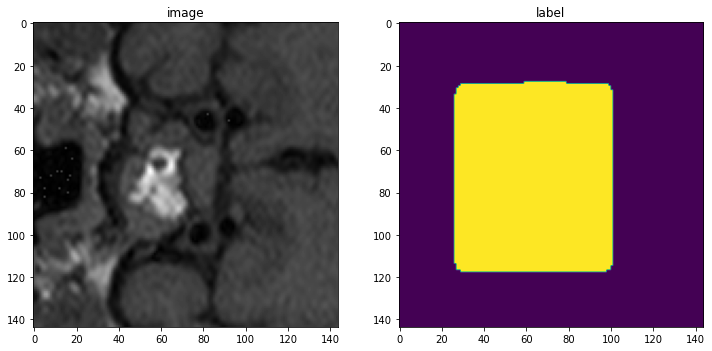

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


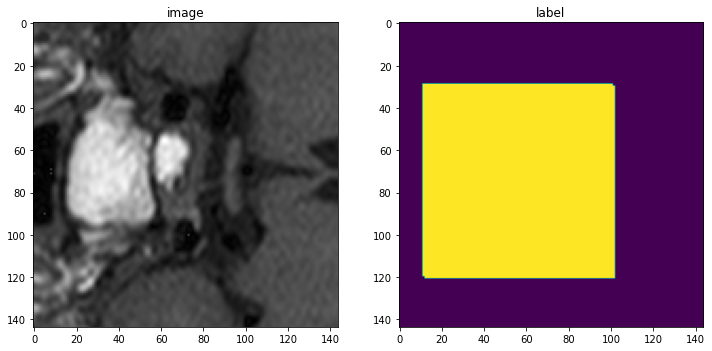

image shape: torch.Size([144, 144]), label shape: torch.Size([144, 144])


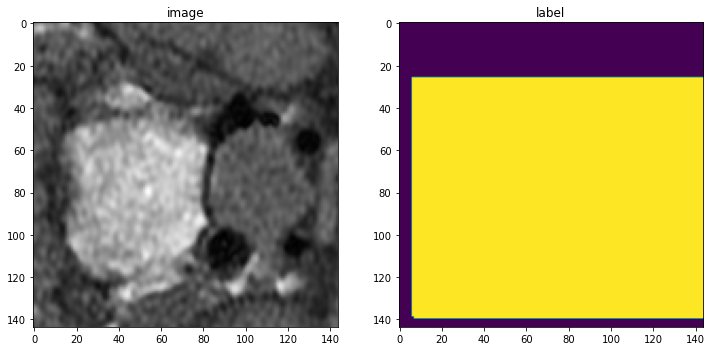

In [83]:
# Transforms


valid_ds = Dataset(data=valid_datadict+train_datadict, transform=valid_transforms)
valid_loader = DataLoader(valid_ds, batch_size=1)

count_ims = 0
for check_data in valid_loader:
    image, label = (check_data[0][0][0], check_data[1][0][0])
    print(f"image shape: {image.shape}, label shape: {label.shape}")
    # plot the slice [:, :, 21]
    plt.figure("check", (12, 6))
    plt.subplot(1, 2, 1)
    plt.title("image")
    plt.imshow(image, cmap="gray")
    plt.subplot(1, 2, 2)
    plt.title("label")
    plt.imshow(label)
    plt.show()
    
    count_ims += 1
    
    if count_ims == 30:
        break

#valid_loader = DataLoader(valid_ds, batch_size=1, shuffle=True, num_workers=2)

Item  0 :  torch.Size([1, 1, 144, 144]) torch.Size([2, 144, 144]) torch.Size([1, 1, 144, 144])
Validation 0


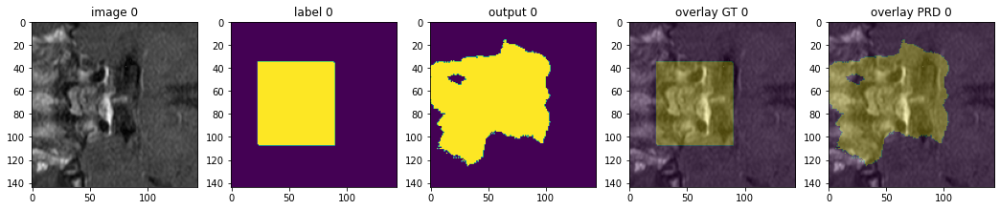

Validation 1


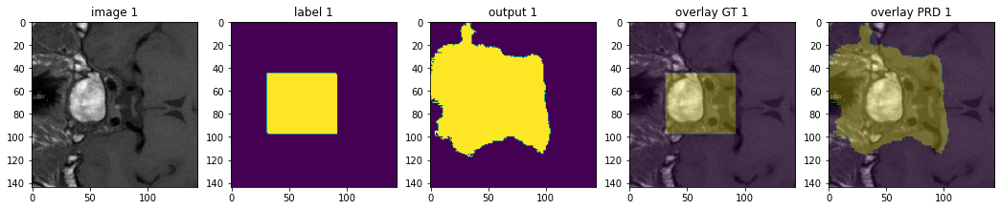

Validation 2


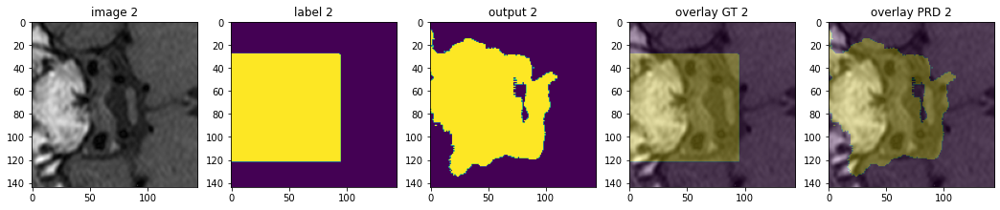

Validation 3


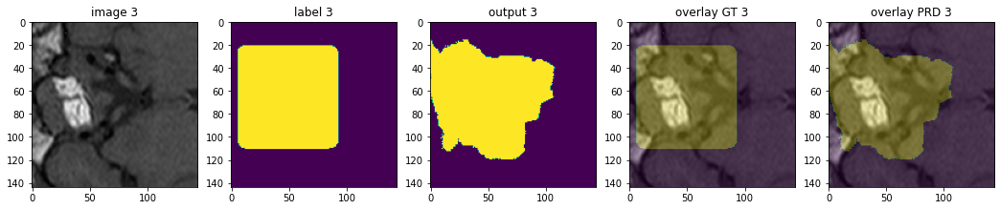

Validation 4


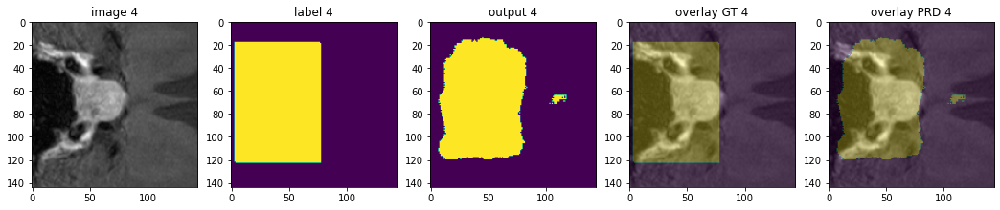

Training Set0


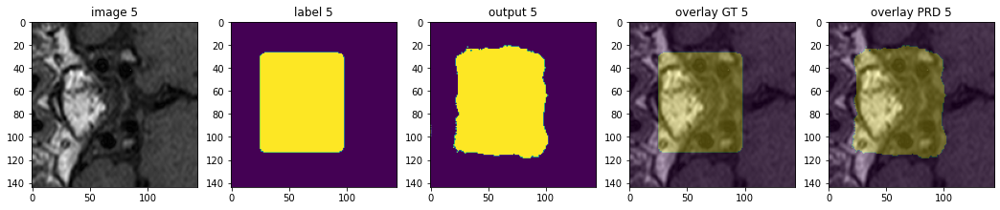

Training Set1


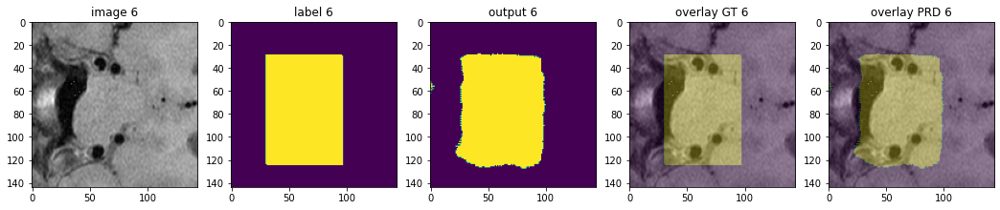

Training Set2


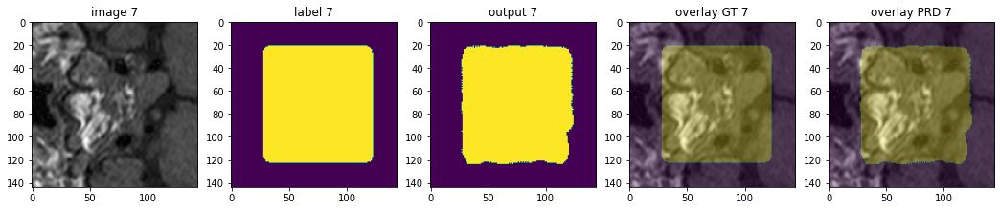

Training Set3


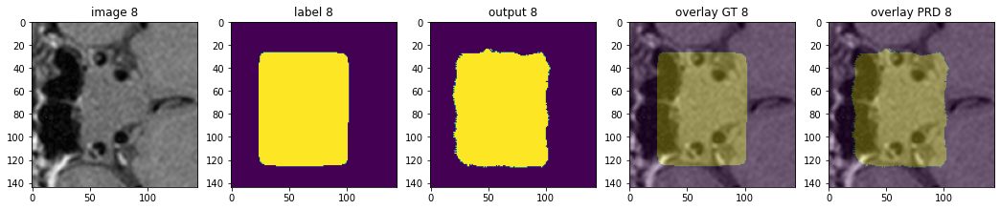

Training Set4


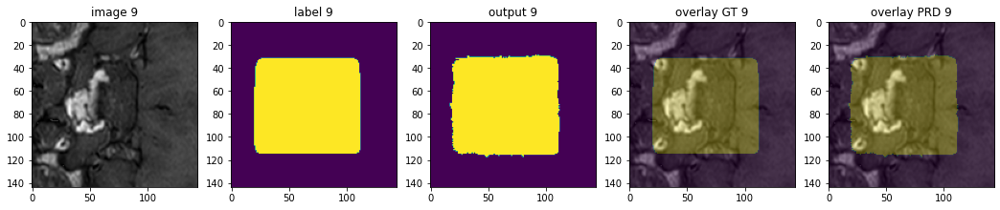

Training Set5


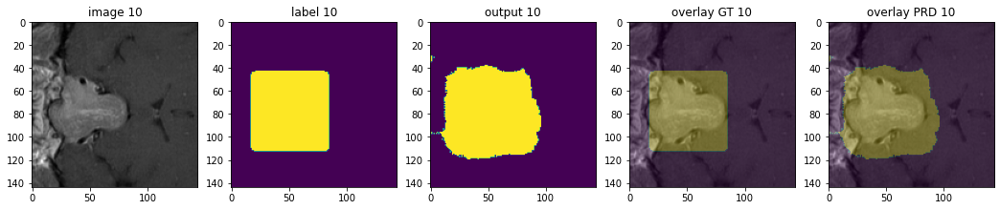

Training Set6


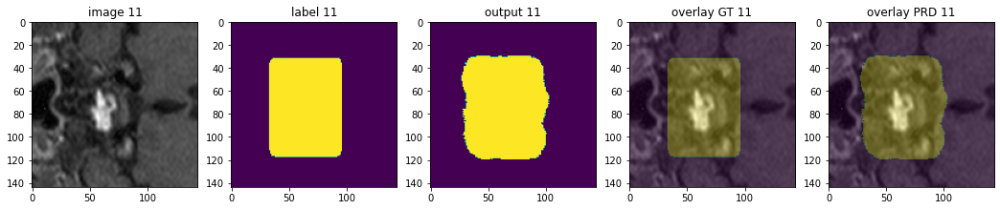

Training Set7


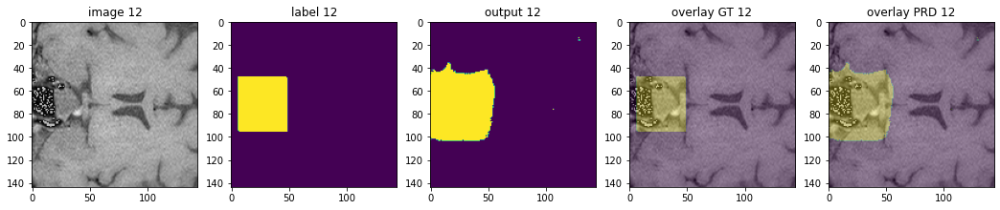

Training Set8


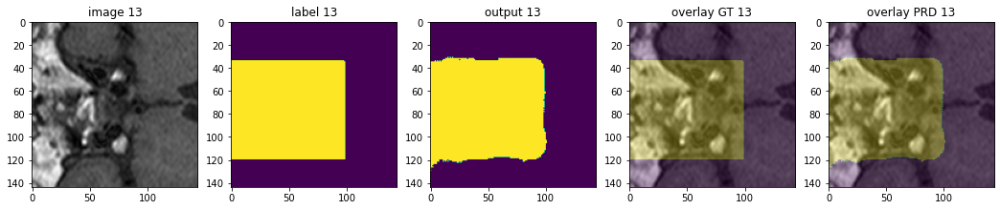

Training Set9


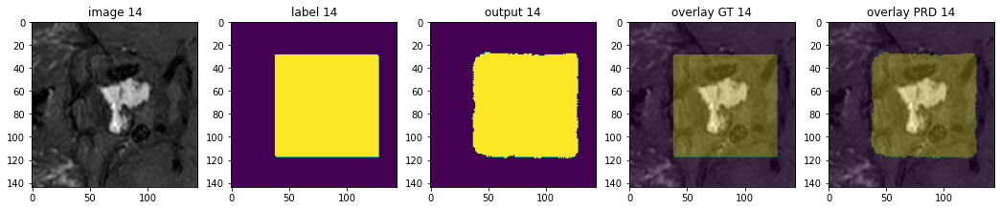

Training Set10


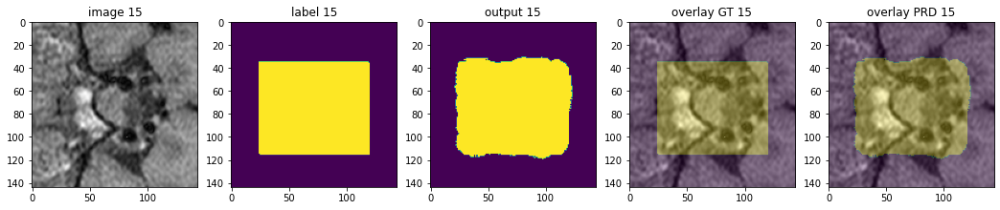

Training Set11


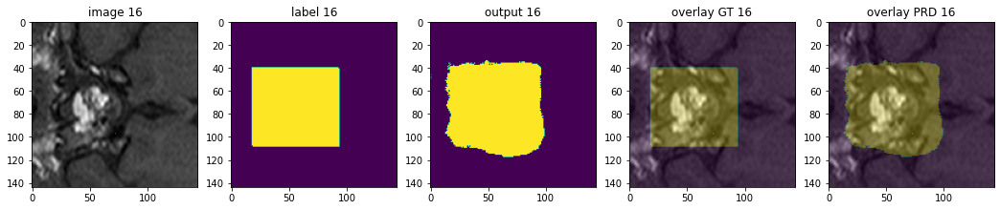

Training Set12


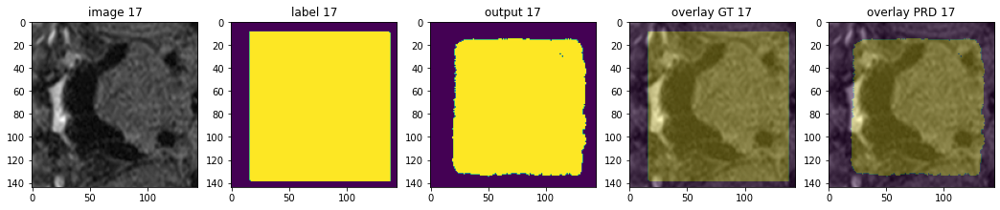

Training Set13


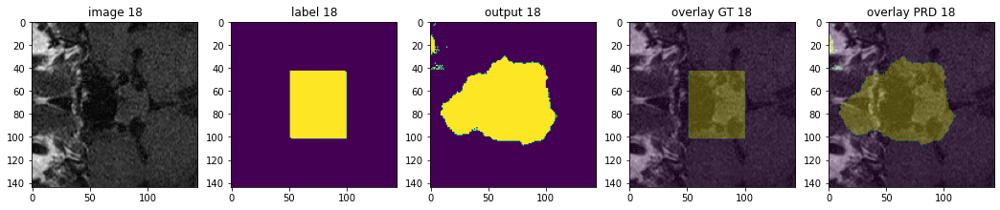

Training Set14


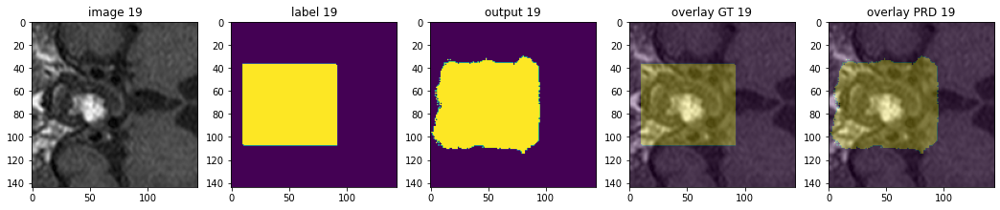

Training Set15


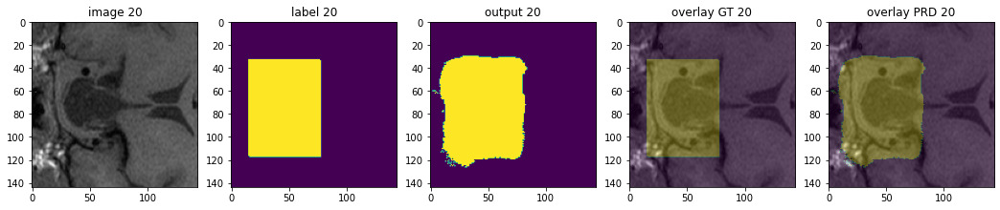

Training Set16


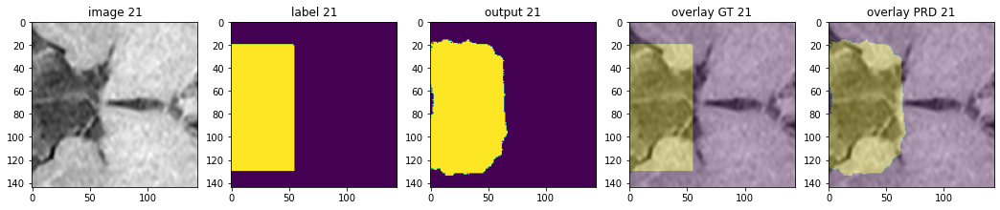

Training Set17


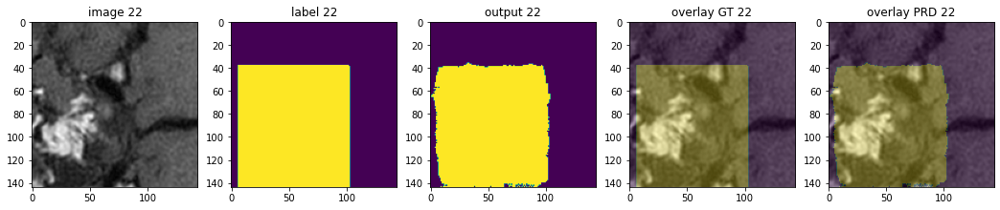

Training Set18


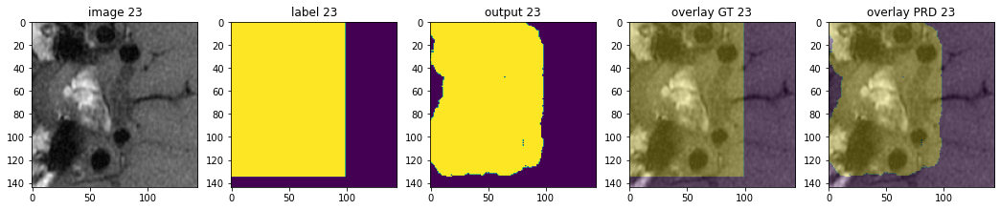

Training Set19


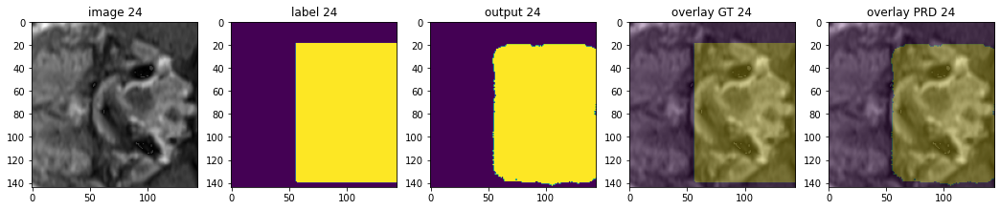

Training Set20


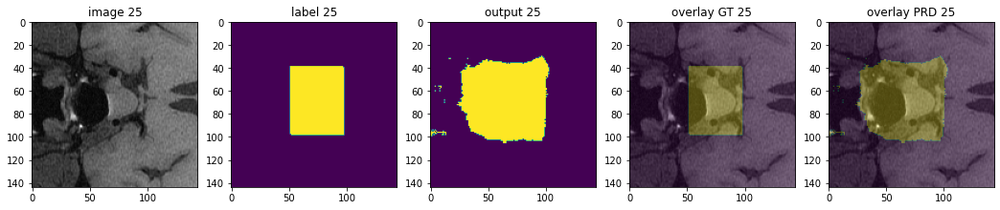

Training Set21


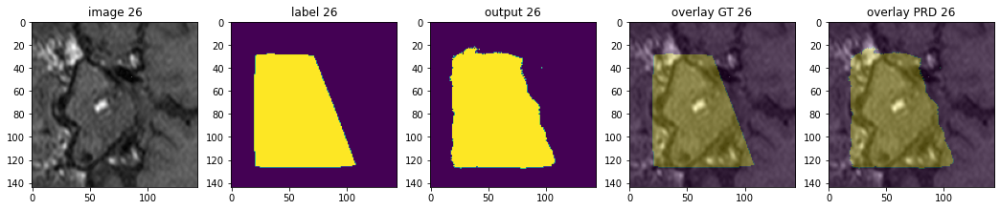

Training Set22


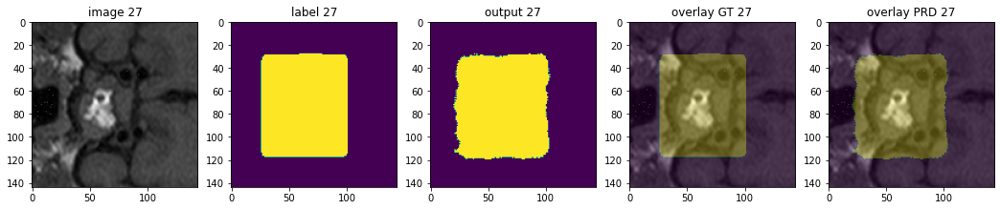

Training Set23


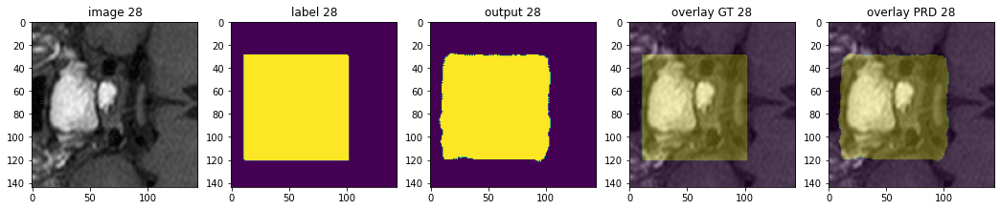

Training Set24


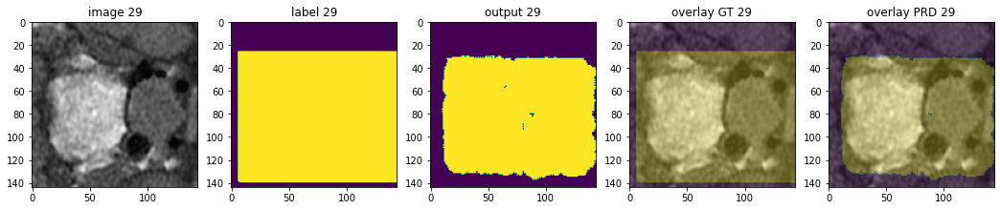

Training Set25


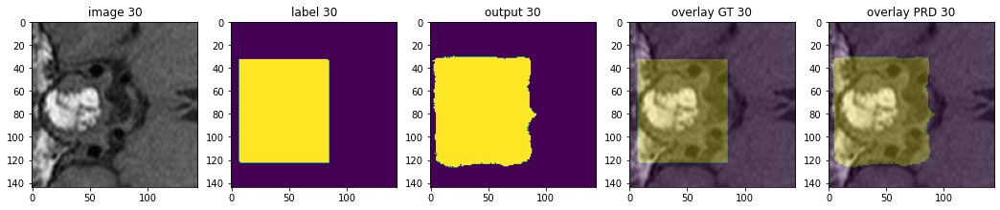

Training Set26


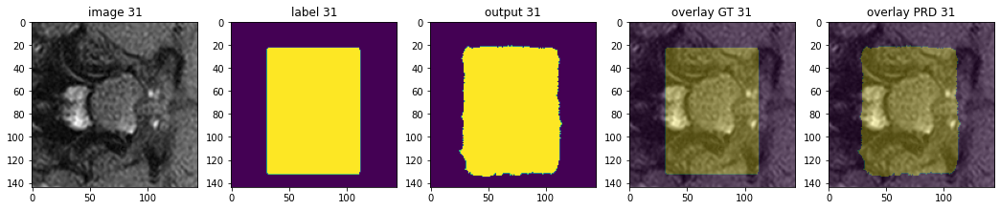

Training Set27


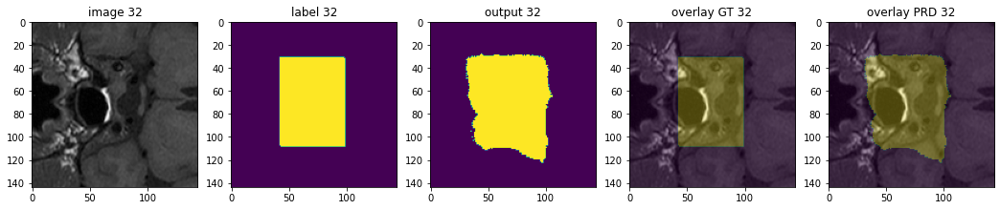

Training Set28


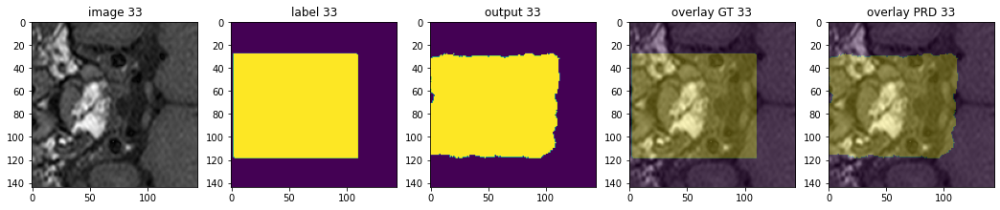

Training Set29


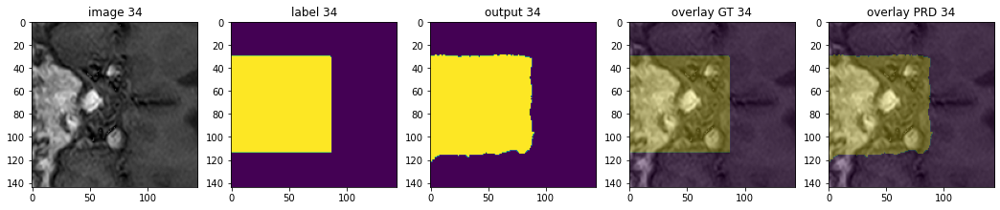

Training Set30


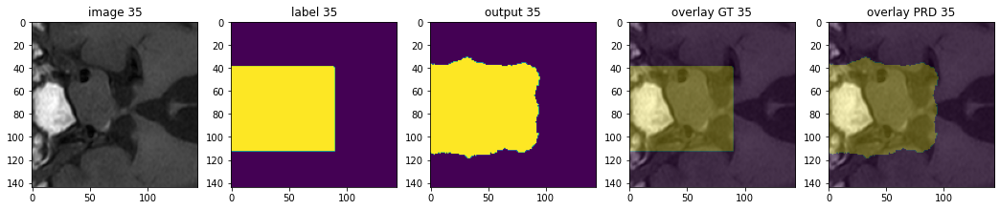

Training Set31


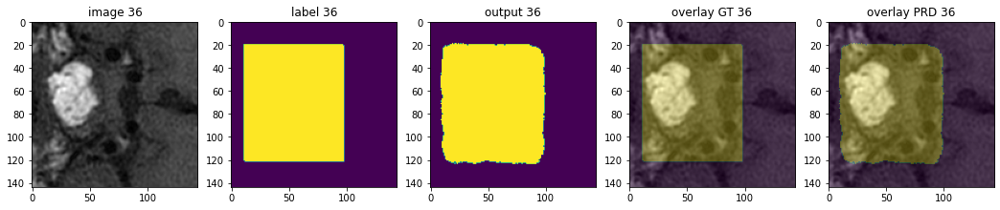

Training Set32


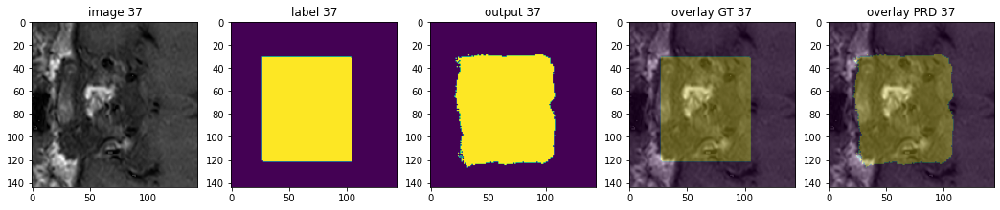

Training Set33


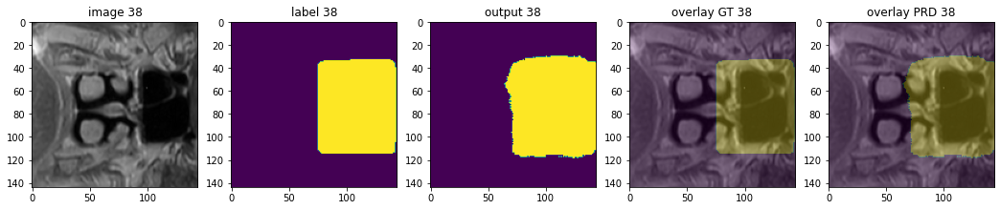

Training Set34


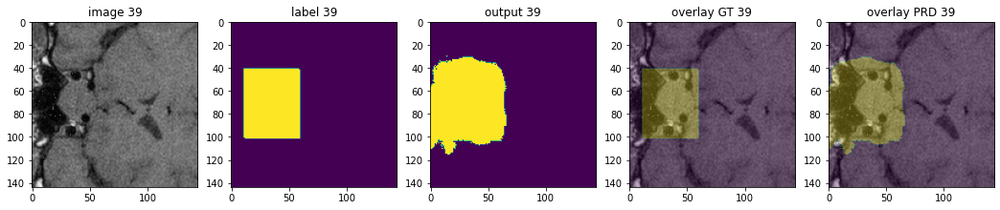

Training Set35


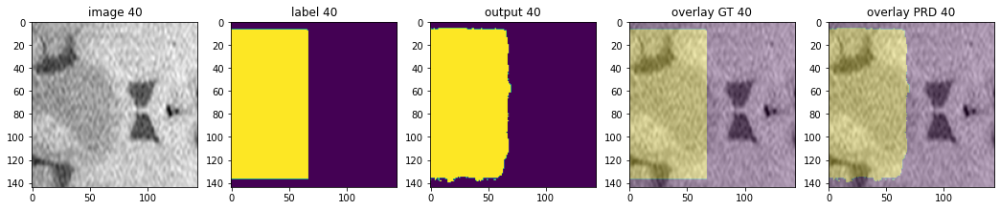

Training Set36


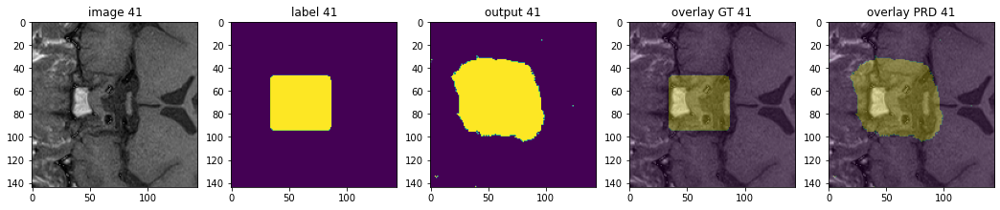

Training Set37


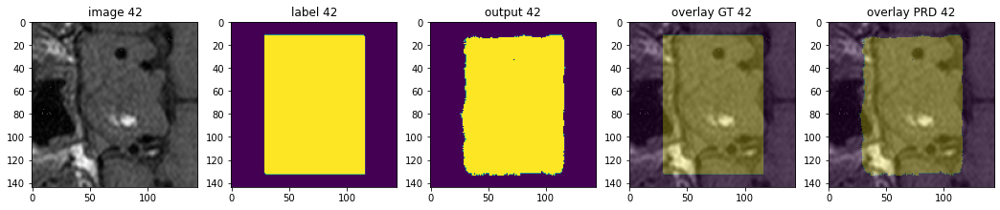

Training Set38


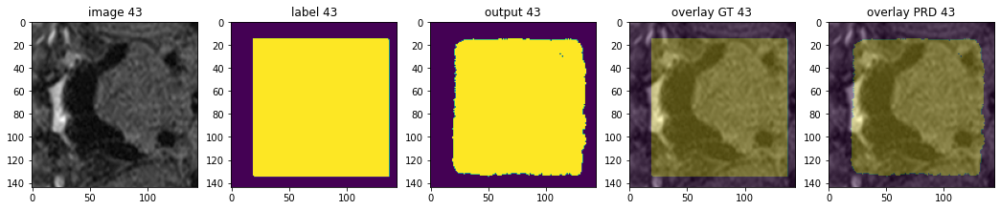

Training Set39


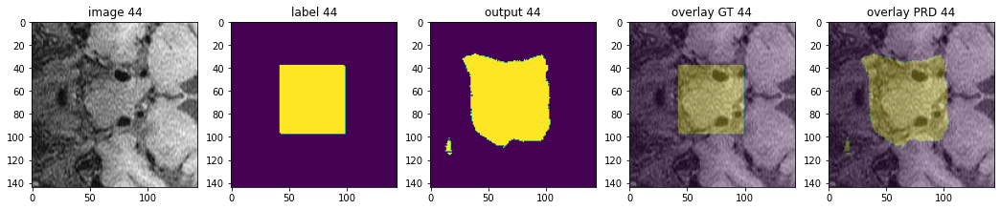

Training Set40


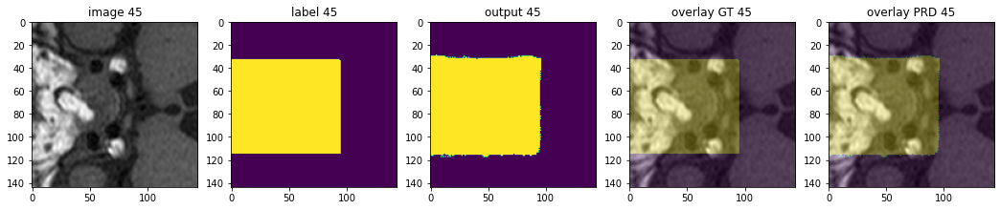

Training Set41


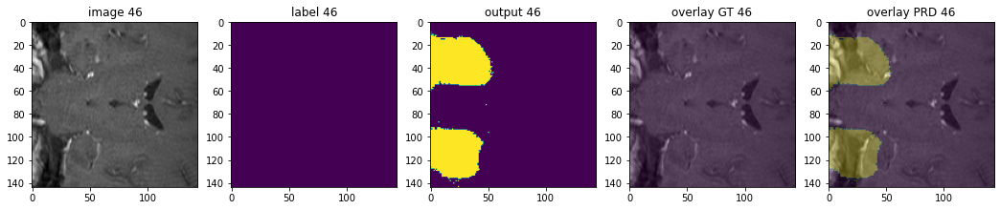

Training Set42


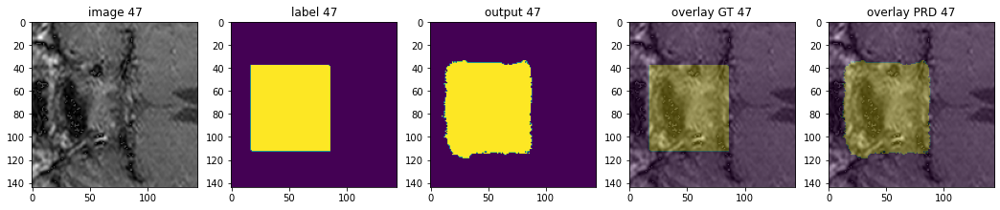

Training Set43


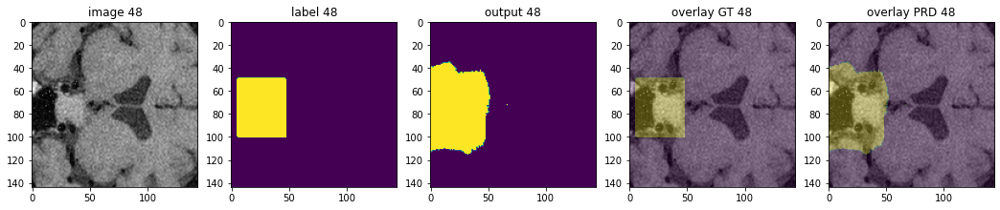

Training Set44


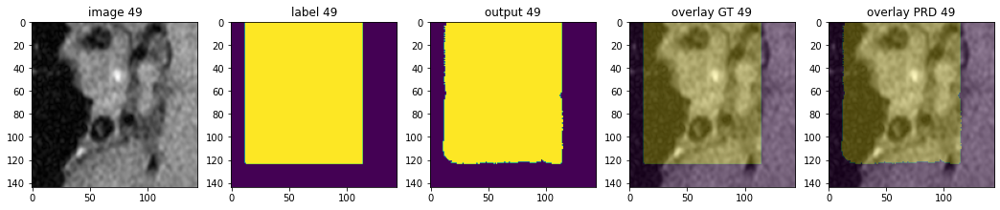

In [95]:
from helpers.viz import *



# UNET model
model1 = UNet(
    spatial_dims=2,
    in_channels=1,
    out_channels=2,
    channels=(4, 8, 16, 32, 64),
    strides=(2, 2, 2, 2),
)

SAVED_MODEL_PATH = "/home/gologors/data/saved_models/finetune_learning_unet/fastai/unet2d_1ch/1653581449_Thu_May_26_2022_hr_12_min_10"

model1.load_state_dict(torch.load(f"{SAVED_MODEL_PATH}/model.pth")["model"])
model1.eval()

# model.load_state_dict(torch.load(
#     os.path.join(save_model_dir, "best_metric_model.pth")))

#model.eval()

with torch.no_grad():
    for i, val_data in enumerate(valid_loader):
        val_inputs, val_labels = (
            val_data[0],
            val_data[1],
        )
        val_outputs = model1(val_inputs).squeeze()
        
        if i == 0:
            print("Item ", i, ": ", val_inputs.shape, val_outputs.shape, val_labels.shape)
        
        if i < len(valid_datadict):
            print("Validation " + str(i))
        else:
            print("Training Set" + str(i - len(valid_datadict)))
            
        # plot the slice [:, :, 80]
        plt.figure("check", (18, 6))
        plt.subplot(1, 5, 1)
        plt.title(f"image {i}")
        plt.imshow(val_inputs.cpu().squeeze(), cmap="gray")
        plt.subplot(1, 5, 2)
        plt.title(f"label {i}")
        plt.imshow(val_labels.cpu().squeeze())
        plt.subplot(1, 5, 3)
        plt.title(f"output {i}")
        output = torch.argmax(val_outputs, dim=0).detach().cpu()
        plt.imshow(output)
        plt.subplot(1, 5, 4)
        plt.title(f"overlay GT {i}")
        plt.imshow(val_inputs.cpu().squeeze(), cmap="gray")
        plt.imshow(val_labels.cpu().squeeze(), alpha=0.3)
        plt.subplot(1, 5, 5)
        plt.title(f"overlay PRD {i}")
        plt.imshow(val_inputs.cpu().squeeze(), cmap="gray")
        plt.imshow(output, alpha=0.3)
        plt.show()


In [ ]:
viz_compare_outputs(val_inputs[0].cpu().squeeze(), val_labels[0].cpu().squeeze(), val_outputs[0].cpu().squeeze())

In [ ]:
viz_compare_outputs??

In [ ]:
learn.unfreeze()

In [ ]:
learn.lr_find()

In [ ]:
learn.fit_one_cycle(50, lr_max=slice(1e-4,1e-2))

In [ ]:
learn.metric_names

In [ ]:
model.load_state_dict(torch.load(
    os.path.join(save_model_dir, "best_metric_model.pth")))
model.eval()

with torch.no_grad():
    for i, val_data in enumerate(val_loader):
        roi_size = (160, 160, 160)
        sw_batch_size = 4
        val_outputs = sliding_window_inference(
            val_data["image"].to(device), roi_size, sw_batch_size, model
        )
        # plot the slice [:, :, 80]
        plt.figure("check", (18, 6))
        plt.subplot(1, 3, 1)
        plt.title(f"image {i}")
        plt.imshow(val_data["image"][0, 0, :, :, 80], cmap="gray")
        plt.subplot(1, 3, 2)
        plt.title(f"label {i}")
        plt.imshow(val_data["label"][0, 0, :, :, 80])
        plt.subplot(1, 3, 3)
        plt.title(f"output {i}")
        plt.imshow(torch.argmax(
            val_outputs, dim=1).detach().cpu()[0, :, :, 80])
        plt.show()
        if i == 2:
            break